# L.14  : Naive Bayes Classification Algorithm

![codebasics - Machine Learning Tutorial Python - 14 Naive Bayes Classifier Algorithm Part 1 [PPeaRc-r1OI - 949x534 - 0m01s].png](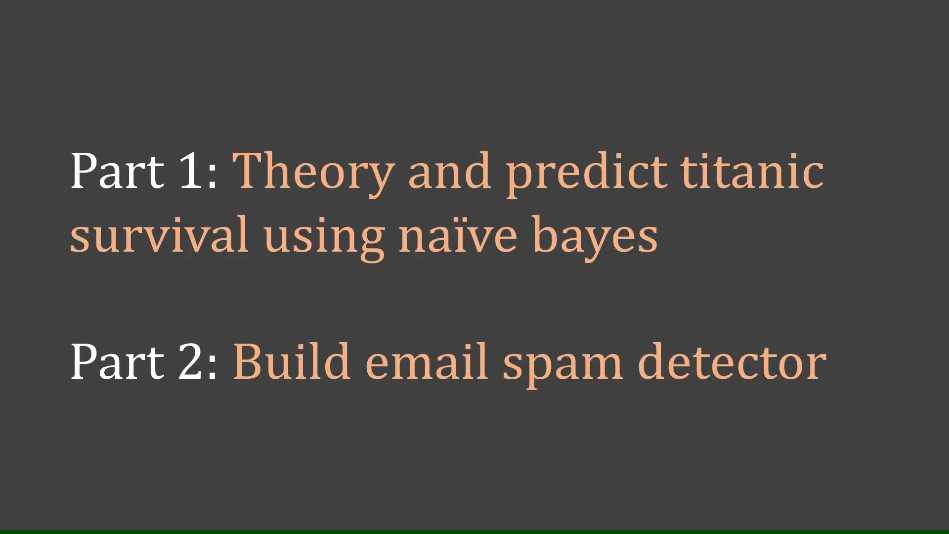)

Conditional Probability

![codebasics - Machine Learning Tutorial Python - 14 Naive Bayes Classifier Algorithm Part 1 [PPeaRc-r1OI - 949x534 - 2m13s].png](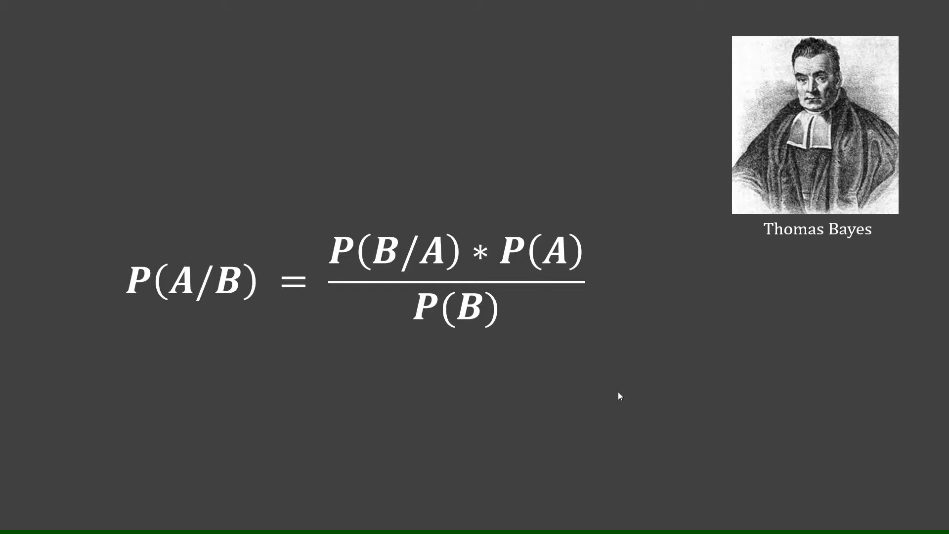)

![codebasics - Machine Learning Tutorial Python - 14 Naive Bayes Classifier Algorithm Part 1 [PPeaRc-r1OI - 949x534 - 2m21s].png](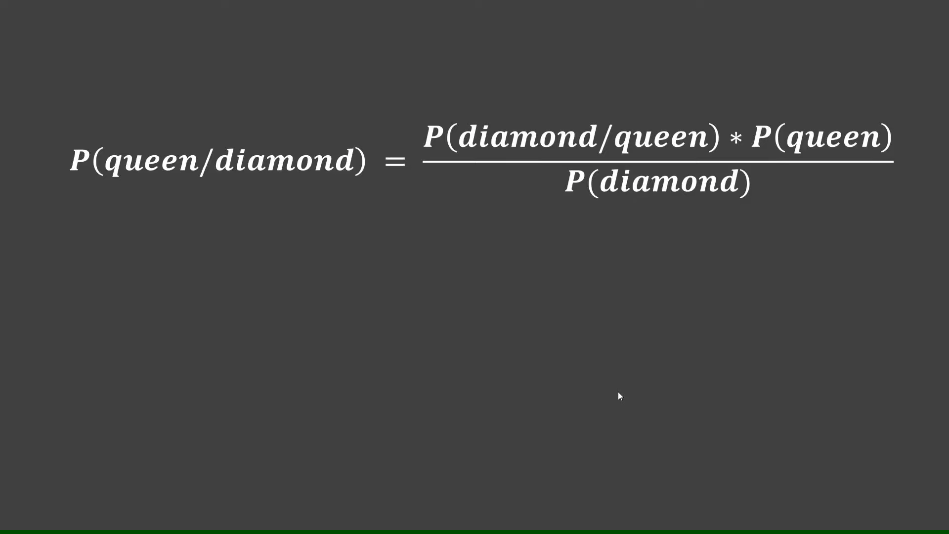)

# Titanic Crash survival rate prediction

![codebasics - Machine Learning Tutorial Python - 14 Naive Bayes Classifier Algorithm Part 1 [PPeaRc-r1OI - 949x534 - 2m57s].png](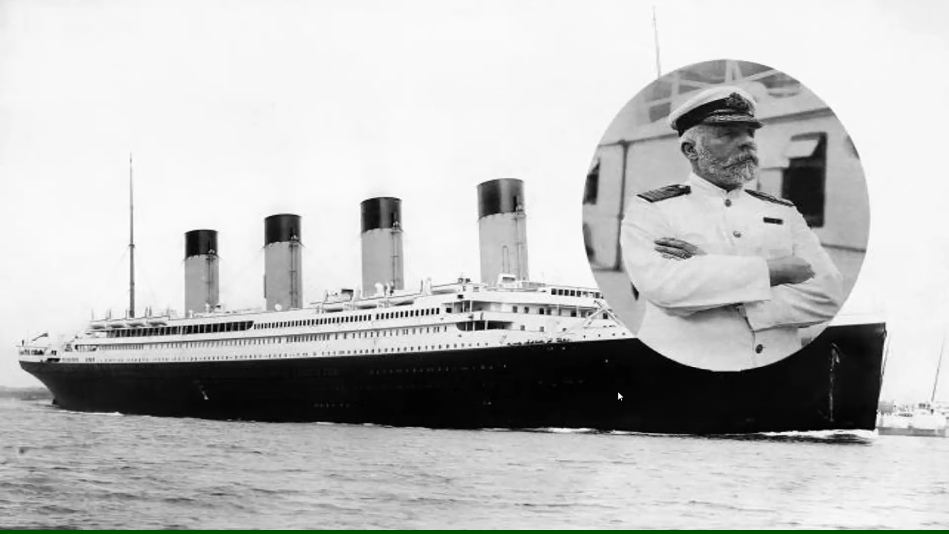)

![codebasics - Machine Learning Tutorial Python - 14 Naive Bayes Classifier Algorithm Part 1 [PPeaRc-r1OI - 949x534 - 3m07s].png](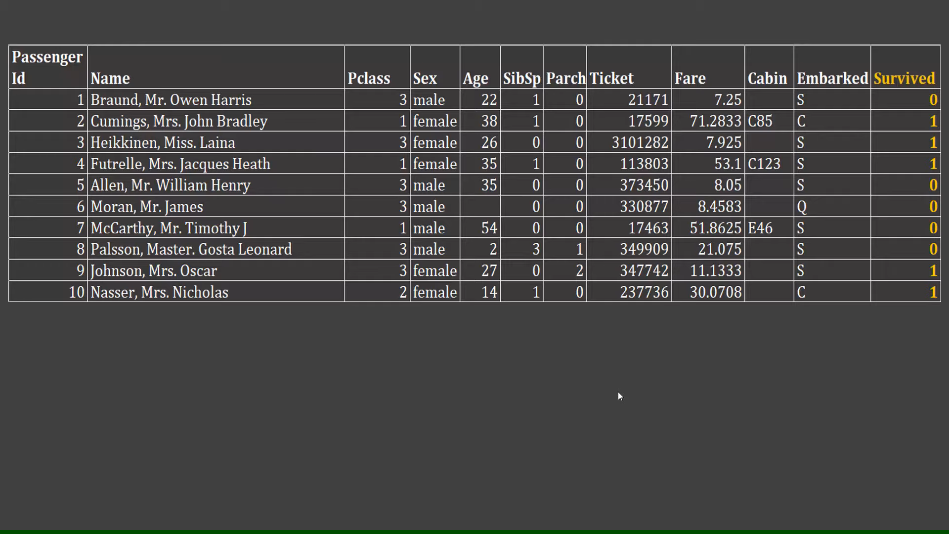)

![codebasics - Machine Learning Tutorial Python - 14 Naive Bayes Classifier Algorithm Part 1 [PPeaRc-r1OI - 949x534 - 3m27s].png](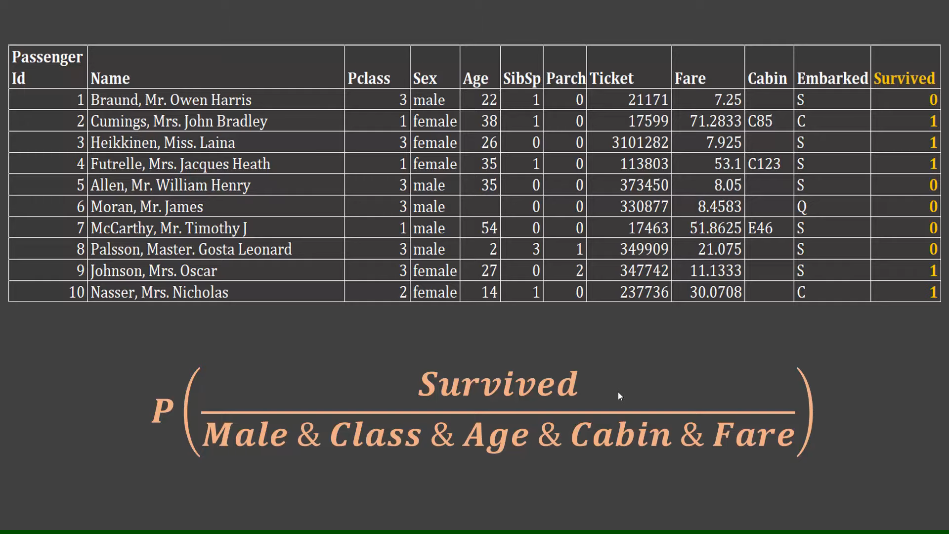)

![codebasics - Machine Learning Tutorial Python - 14 Naive Bayes Classifier Algorithm Part 1 [PPeaRc-r1OI - 949x534 - 3m33s].png](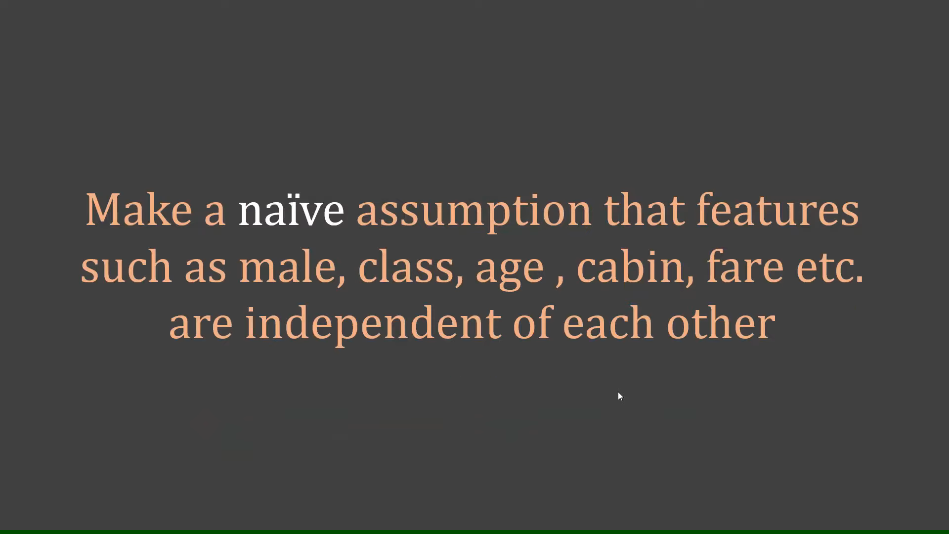)

Naive bayes is used for many scenarios:

![codebasics - Machine Learning Tutorial Python - 14 Naive Bayes Classifier Algorithm Part 1 [PPeaRc-r1OI - 949x534 - 4m32s].png](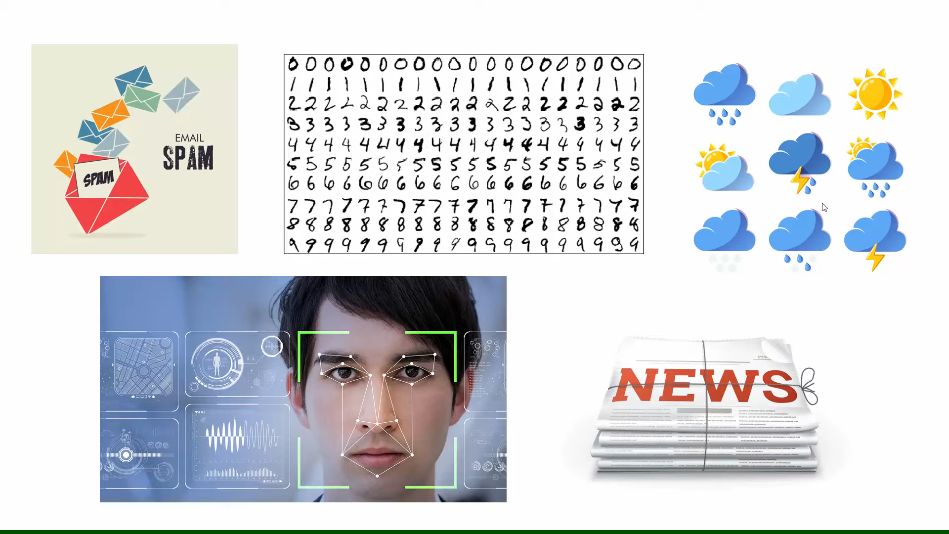)

To understand naive bayes classifier

https://www.youtube.com/watch?v=Q8l0Vip5YUw

Some photos from the video given above is :   

![Serrano.Academy - Naive Bayes classifier A friendly approach [Q8l0Vip5YUw - 949x534 - 1m18s].png](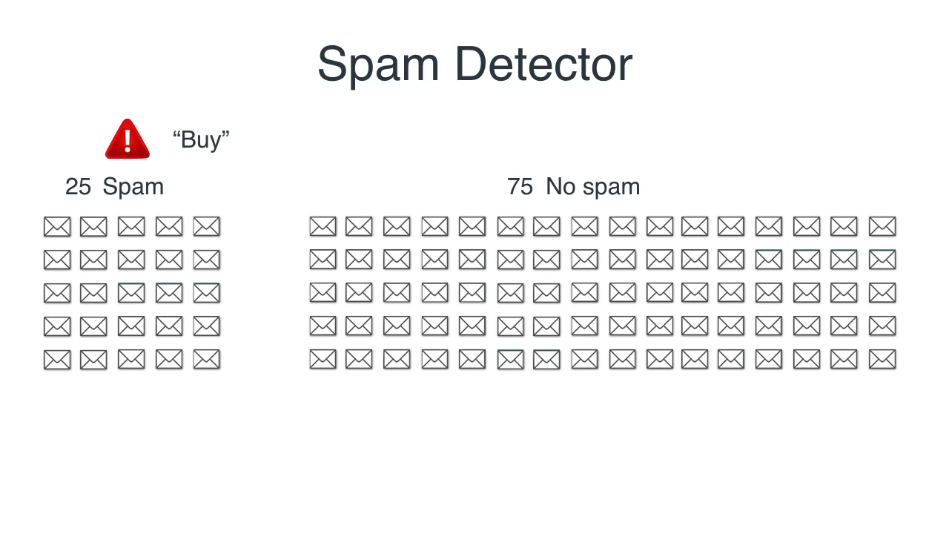)

![Serrano.Academy - Naive Bayes classifier A friendly approach [Q8l0Vip5YUw - 949x534 - 13m50s].png](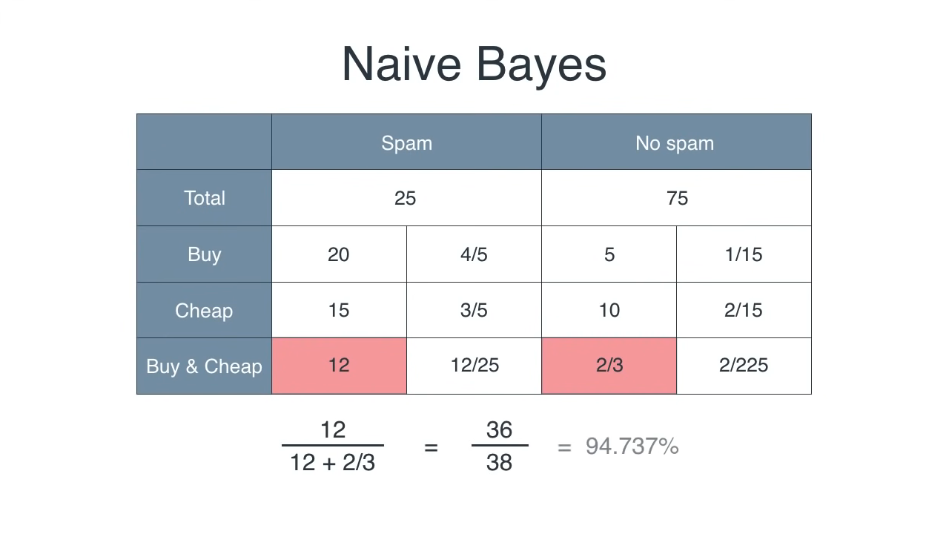)

![Serrano.Academy - Naive Bayes classifier A friendly approach [Q8l0Vip5YUw - 949x534 - 16m17s].png](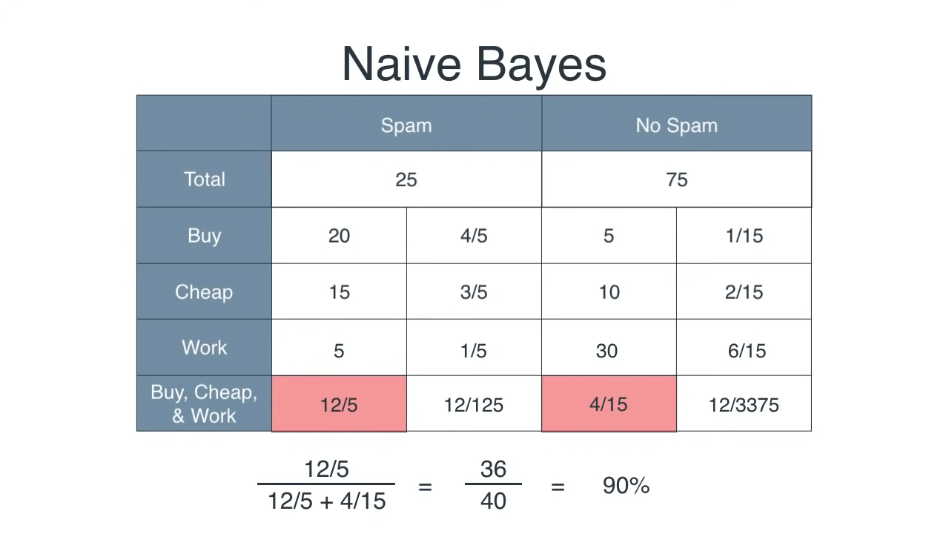)

Naive bayes helps come combine bunch of different features to predict something.



![Serrano.Academy - Naive Bayes classifier A friendly approach [Q8l0Vip5YUw - 949x534 - 18m17s].png](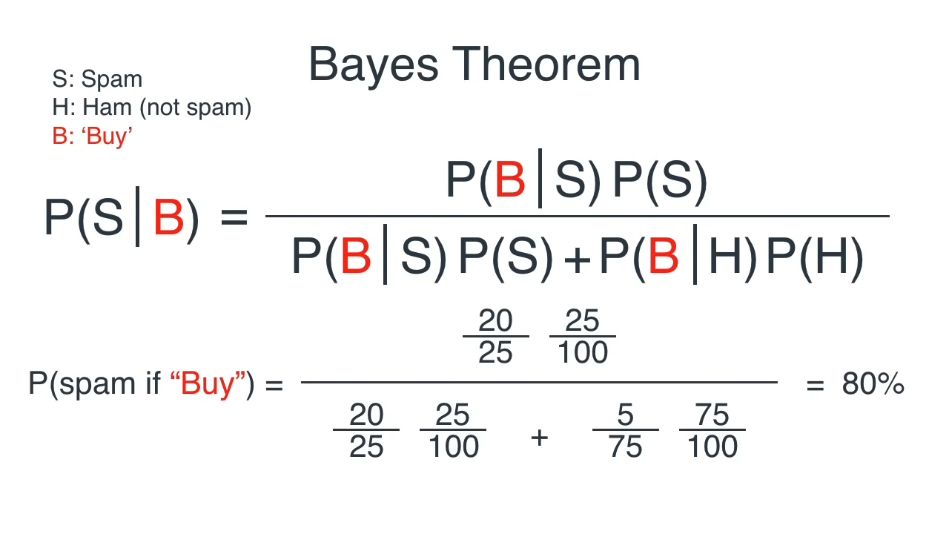)

![Serrano.Academy - Naive Bayes classifier A friendly approach [Q8l0Vip5YUw - 949x534 - 19m49s].png](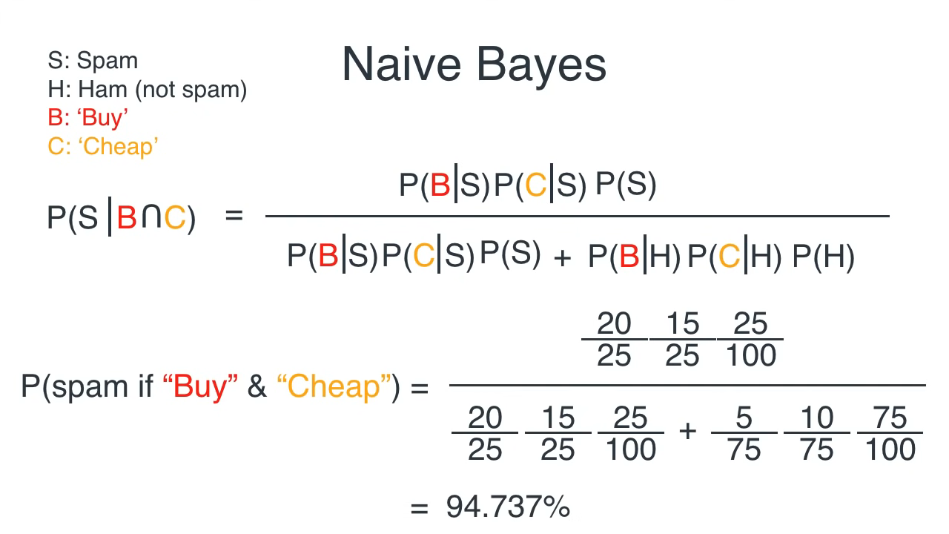)

In [ ]:
import pandas as pd
df = pd.read_csv("titanic.csv")
df.head()

,PassengerId,Name,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked,Survived
0,1,"Braund, Mr. Owen Harris",3,male,22.0,1,0,A/5 21171,7.2500,NaN,S,0
1,2,"Cumings, Mrs. John Bradley (Florence Briggs Th...",1,female,38.0,1,0,PC 17599,71.2833,C85,C,1
2,3,"Heikkinen, Miss. Laina",3,female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S,1
3,4,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",1,female,35.0,1,0,113803,53.1000,C123,S,1
4,5,"Allen, Mr. William Henry",3,male,35.0,0,0,373450,8.0500,NaN,S,0


In [ ]:
df.drop(['PassengerId','Name','SibSp','Parch','Ticket','Cabin','Embarked'], axis='columns',inplace=True)
df.head()

,Pclass,Sex,Age,Fare,Survived
0,3,male,22.0,7.2500,0
1,1,female,38.0,71.2833,1
2,3,female,26.0,7.9250,1
3,1,female,35.0,53.1000,1
4,3,male,35.0,8.0500,0


In [ ]:
target = df['Survived']
inputs = df.drop('Survived', axis='columns')

In [ ]:
target

0      0
1      1
2      1
3      1
4      0
      ..
886    0
887    1
888    0
889    1
890    0
Name: Survived, Length: 891, dtype: int64

In [ ]:
inputs

,Pclass,Sex,Age,Fare
0,3,male,22.0,7.2500
1,1,female,38.0,71.2833
2,3,female,26.0,7.9250
3,1,female,35.0,53.1000
4,3,male,35.0,8.0500
...,...,...,...,...
886,2,male,27.0,13.0000
887,1,female,19.0,30.0000
888,3,female,NaN,23.4500
889,1,male,26.0,30.0000


In [ ]:
# one-hot encoding
dummies = pd.get_dummies(inputs.Sex,dtype=int)
dummies.head()

,female,male
0,0,1
1,1,0
2,1,0
3,1,0
4,0,1


In [ ]:
# appending these dummy columns into dataframes
inputs = pd.concat([inputs,dummies],axis='columns')
inputs.head(3)

,Pclass,Sex,Age,Fare,female,male
0,3,male,22.0,7.2500,0,1
1,1,female,38.0,71.2833,1,0
2,3,female,26.0,7.9250,1,0


In [ ]:
inputs.drop('Sex',axis='columns',inplace=True)
inputs.head()

,Pclass,Age,Fare,female,male
0,3,22.0,7.2500,0,1
1,1,38.0,71.2833,1,0
2,3,26.0,7.9250,1,0
3,1,35.0,53.1000,1,0
4,3,35.0,8.0500,0,1


Now all the numbers, there are no text.

In [ ]:
inputs.Age[:10]

0    22.0
1    38.0
2    26.0
3    35.0
4    35.0
5     NaN
6    54.0
7     2.0
8    27.0
9    14.0
Name: Age, dtype: float64

So these are some NaN values. We need to fill them.

In [ ]:
inputs.Age = inputs.Age.fillna(inputs.Age.mean())

In [ ]:
inputs.Age[:10]

0    22.000000
1    38.000000
2    26.000000
3    35.000000
4    35.000000
5    29.699118
6    54.000000
7     2.000000
8    27.000000
9    14.000000
Name: Age, dtype: float64

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(inputs, target, test_size=0.2)

In [ ]:
len(X_train), len(X_test), len(y_train), len(y_test)

(712, 179, 712, 179)

In [ ]:
# creating the naive bayes model

from sklearn.naive_bayes import GaussianNB
model = GaussianNB()

In [ ]:
model

GaussianNB()

In [ ]:
model.fit(X_train, y_train)

GaussianNB()

In [ ]:
model.score(X_train, y_train)

0.7921348314606742

In [ ]:
model.score(X_test,y_test)

0.7486033519553073

Not a very good prediction of the survival based on Pclass 	Age 	Fare ; but 75 % is ok not bad.

In [ ]:
X_test[:10] # first 10

,Pclass,Age,Fare,female,male
461,3,34.000000,8.0500,0,1
39,3,14.000000,11.2417,1,0
732,2,29.699118,0.0000,0,1
227,3,20.500000,7.2500,0,1
98,2,34.000000,23.0000,1,0
132,3,47.000000,14.5000,1,0
574,3,16.000000,8.0500,0,1
169,3,28.000000,56.4958,0,1
854,2,44.000000,26.0000,1,0
879,1,56.000000,83.1583,1,0


In [ ]:
y_test[:10]

461    0
39     1
732    0
227    0
98     1
132    0
574    0
169    0
854    0
879    1
Name: Survived, dtype: int64

In [ ]:
model.predict(X_test[:10])

array([0, 1, 0, 0, 1, 1, 0, 0, 1, 1])

In [ ]:
model.predict_proba(X_test[:10])

array([[9.91544890e-01, 8.45510988e-03],
       [3.66629503e-02, 9.63337050e-01],
       [9.78561316e-01, 2.14386838e-02],
       [9.90204244e-01, 9.79575647e-03],
       [2.09594752e-02, 9.79040525e-01],
       [4.51695605e-02, 9.54830439e-01],
       [9.89239373e-01, 1.07606266e-02],
       [9.81105173e-01, 1.88948269e-02],
       [1.95255855e-02, 9.80474414e-01],
       [5.27468316e-04, 9.99472532e-01]])

[ not survive , survive ] probabilities

# L15. Email spam detection : using Naive Bayes

In [ ]:
import pandas as pd
df = pd.read_csv("spam.csv")
df.head()

,Category,Message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


In [ ]:
df.groupby('Category').describe()

Message                                                            \
           count unique                                                top   
Category                                                                     
ham         4825   4516                             Sorry, I'll call later   
spam         747    641  Please call our customer service representativ...   

               
         freq  
Category       
ham        30  
spam        4

ham = not-spam

In [ ]:
df['spam'] = df['Category'].apply(lambda x: 1 if x=='spam' else 0)
df.head()

,Category,Message,spam
0,ham,"Go until jurong point, crazy.. Available only ...",0
1,ham,Ok lar... Joking wif u oni...,0
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...,1
3,ham,U dun say so early hor... U c already then say...,0
4,ham,"Nah I don't think he goes to usf, he lives aro...",0


added a new spam column

![codebasics - Machine Learning Tutorial Python - 15 Naive Bayes Classifier Algorithm Part 2 [nHIUYwN-5rM - 949x534 - 3m27s].png](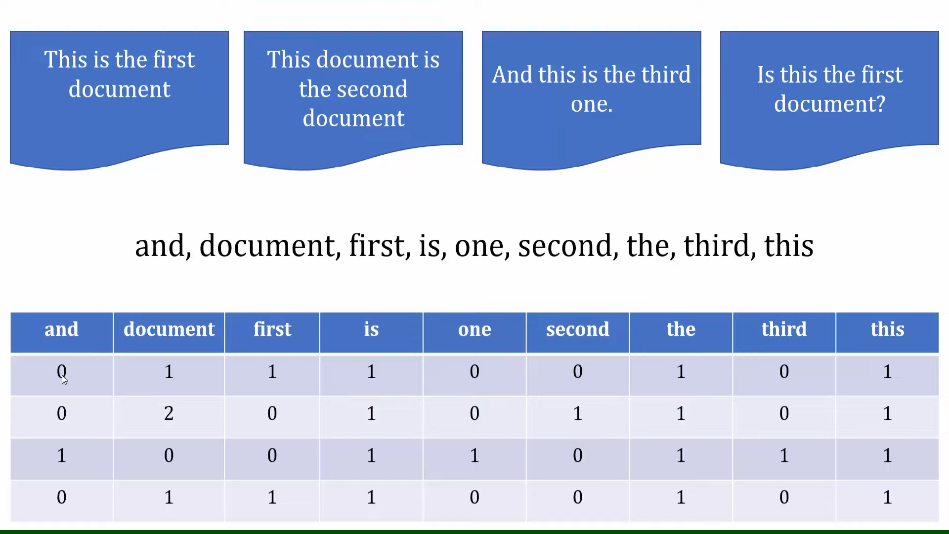)

All unique words and unke corresponding number of counts kitne hain , us paritular sentence me : is basis pr feature vector bnta hai by CountVectorizer: as see above table, puri table words ke count pr based hai. So sentences are now in form of numbers, jo ki ML model chahta hai.

feature vector of a sentence = row : telling how many times that particular word has come in that particular sentence.

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df.Message, df.spam, test_size=0.25)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
v = CountVectorizer()
X_train_count = v.fit_transform(X_train.values)
X_train_count.toarray()[:3]

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

So all the sentences, have now been converted in features vectores of values 0 and 1. Each feature is one of the pool of unique words across all the samples.

X_train_count is the text/message converted into a number matrix.

Naive Bayes has three kinds of classifiers ⚛

![codebasics - Machine Learning Tutorial Python - 15 Naive Bayes Classifier Algorithm Part 2 [nHIUYwN-5rM - 949x534 - 4m44s].png](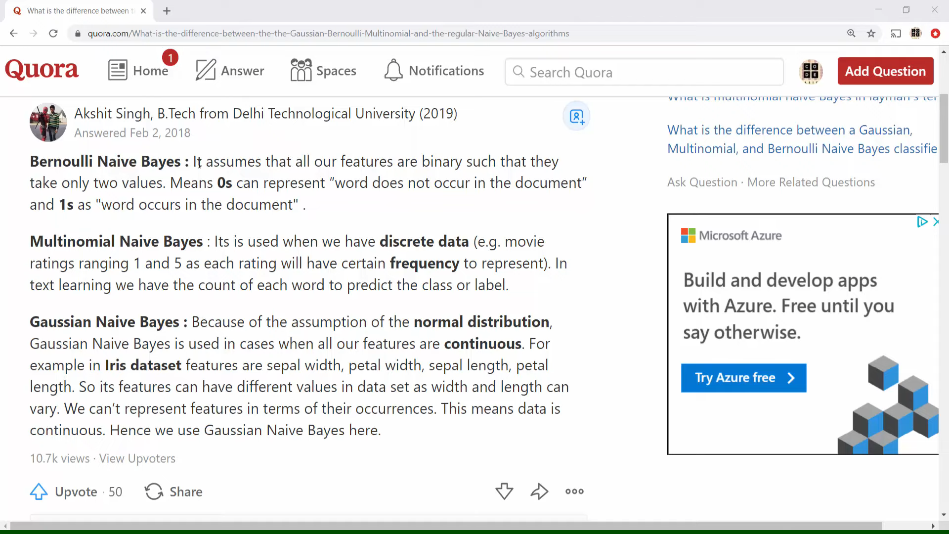)

In [ ]:
# we are going to use MultinomialNB
from sklearn.naive_bayes import MultinomialNB
model = MultinomialNB()
model.fit(X_train_count, y_train)

MultinomialNB()

In [ ]:
emails = [
    'Hey mohan, can we get together to watch footbal game tomorrow?',
    'Upto 20% discount on parking, exclusive offer just for you. Dont miss this reward!'
]
emails_count = v.transform(emails) # means message convert to number
model.predict(emails_count)

array([0, 1])

In [ ]:
X_test_count = v.transform(X_test)
model.score(X_test_count, y_test)

0.9870782483847811

**Sklearn Pipeline**

In [ ]:
from sklearn.pipeline import Pipeline
clf = Pipeline([
    ('vectorizer', CountVectorizer()),
    ('nb', MultinomialNB())
])

In [ ]:
clf.fit(X_train, y_train)

Pipeline(steps=[('vectorizer', CountVectorizer()), ('nb', MultinomialNB())])

since the pipeline internally first convert text to feature/count vector, as per pipeline, hence directoly pass X_TRAIN here.

In [ ]:
clf.score(X_test, y_test)

0.9870782483847811

In [ ]:
clf.predict(emails)

array([0, 1])

# 16. Hyper parameters Tuning : GridSearchCV

First

![codebasics - Machine Learning Tutorial Python - 16 Hyper parameter Tuning (GridSearchCV) [HdlDYng8g9s - 949x534 - 0m18s].png](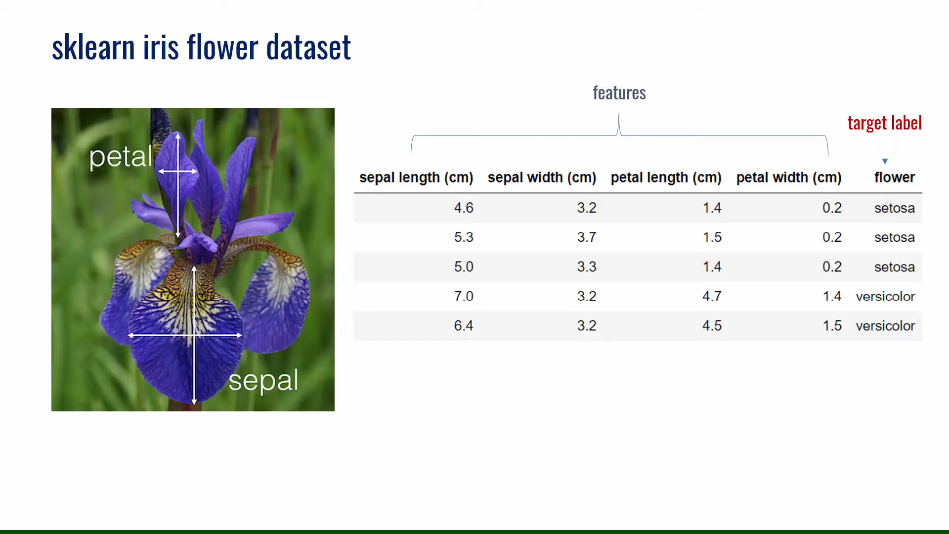)

2, Model Selection

![codebasics - Machine Learning Tutorial Python - 16 Hyper parameter Tuning (GridSearchCV) [HdlDYng8g9s - 949x534 - 0m26s].png](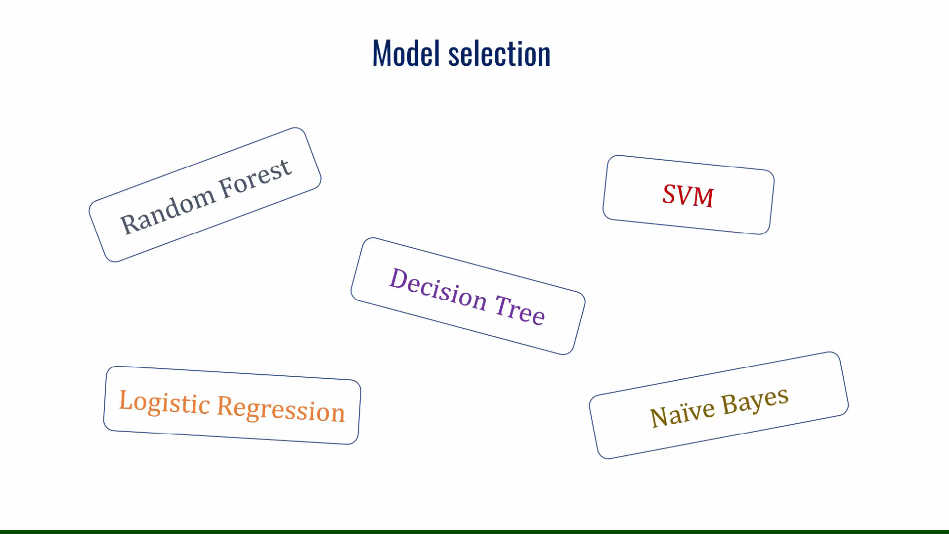)

3. Hyperparameters Tuning

![codebasics - Machine Learning Tutorial Python - 16 Hyper parameter Tuning (GridSearchCV) [HdlDYng8g9s - 949x534 - 0m42s].png](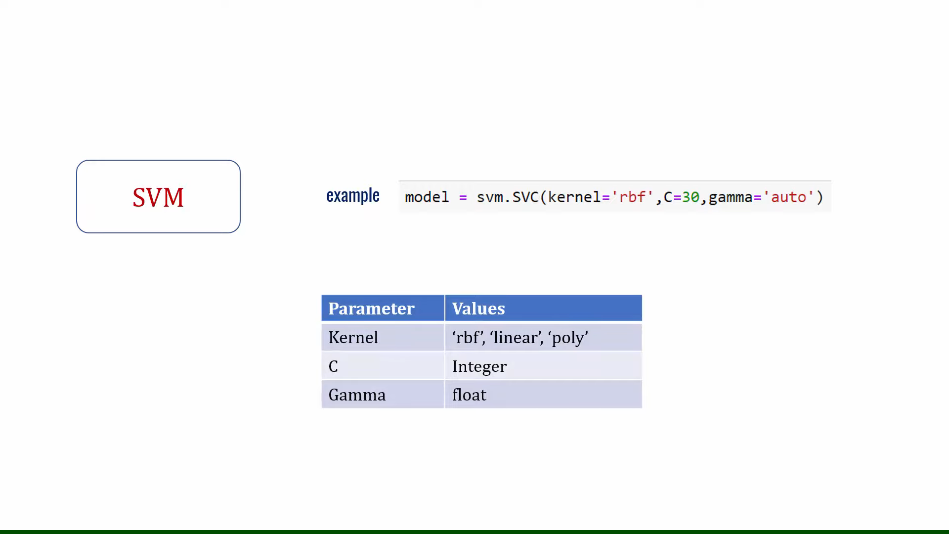)

In [ ]:
from sklearn import svm, datasets
iris = datasets.load_iris()

In [ ]:
import pandas as pd
df = pd.DataFrame(iris.data, columns=iris.feature_names)
df['flower'] = iris.target # that is the name of the labels

In [ ]:
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),flower
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [ ]:
df['flower'] = df['flower'].apply(lambda x : iris.target_names[x])
# df.flower column pr apply kro lambda on each x of that column s.t. each x is replaced by target_names[x]
df[47:52]

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),flower
47,4.6,3.2,1.4,0.2,setosa
48,5.3,3.7,1.5,0.2,setosa
49,5.0,3.3,1.4,0.2,setosa
50,7.0,3.2,4.7,1.4,versicolor
51,6.4,3.2,4.5,1.5,versicolor


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, test_size=0.3)

In [ ]:
model = svm.SVC(kernel = 'rbf', C=30, gamma='auto')
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.9111111111111111

The issue here is that, based on my train and test samples the score will vary.

To get rid of that we use k-fold cross validation and then take average of that as our score.

![codebasics - Machine Learning Tutorial Python - 16 Hyper parameter Tuning (GridSearchCV) [HdlDYng8g9s - 949x534 - 3m31s].png](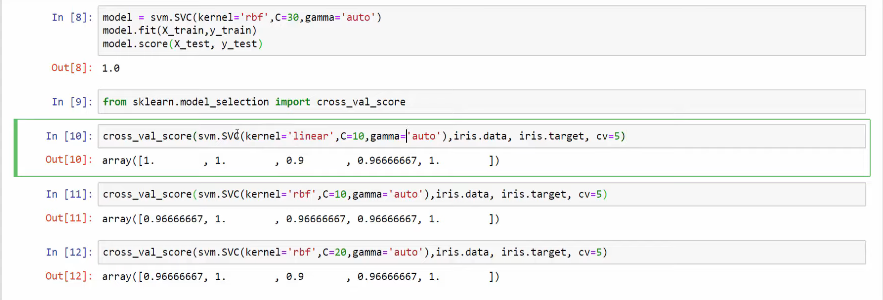)

this might require lots of manual intervention in changing the parameters.

Another way, slightly better than that is that one can use a for loop.

![codebasics - Machine Learning Tutorial Python - 16 Hyper parameter Tuning (GridSearchCV) [HdlDYng8g9s - 949x534 - 4m31s].png](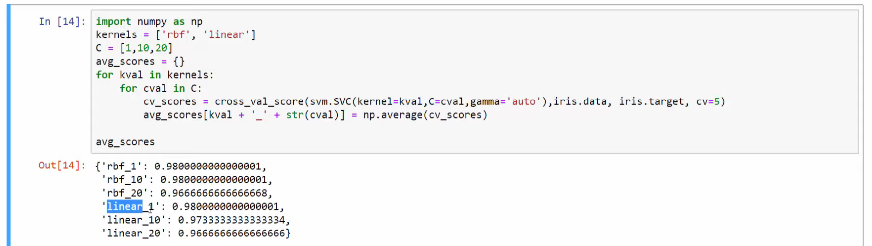)

The issue is that, if I had 4 or 5 or more parameters then I had to run 4 or 5 or more nested for loop => so many iterations, not convenient

Lukily the sklearn provides, an API, called gridsearchcv which will do the exact same thing, as done in the image.

Just in single line of the code, gridsearchcv will do all those for loop stuff.

In [ ]:
from sklearn.model_selection import GridSearchCV

clf = GridSearchCV( svm.SVC(gamma='auto'),{
    'C': [1,10,20],
    'kernel': ['rbf','linear'],
}, cv=5, return_train_score = False )

clf.fit(iris.data, iris.target)
clf.cv_results_

{'mean_fit_time': array([0.00149546, 0.00092368, 0.00114546, 0.00107617, 0.00117164,
        0.00088797]),
 'std_fit_time': array([4.95157119e-04, 1.19389626e-04, 2.42642869e-04, 1.66572631e-04,
        1.28377936e-04, 4.51397840e-05]),
 'mean_score_time': array([0.00084333, 0.00065842, 0.00068917, 0.00076528, 0.00084348,
        0.0006053 ]),
 'std_score_time': array([2.66652412e-04, 1.69496300e-04, 8.44383692e-05, 1.93714026e-04,
        1.24847897e-04, 3.96203762e-05]),
 'param_C': masked_array(data=[1, 1, 10, 10, 20, 20],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_kernel': masked_array(data=['rbf', 'linear', 'rbf', 'linear', 'rbf', 'linear'],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'C': 1, 'kernel': 'rbf'},
  {'C': 1, 'kernel': 'linear'},
  {'C': 10, 'kernel': 'rbf'},
  {'C': 10, 'kernel': 'linear'},
  {'C': 20, 'ker

In [ ]:
# just for seeing cv reslt nicely
df = pd.DataFrame(clf.cv_results_)
df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.001495,0.000495,0.000843,0.000267,1,rbf,"{'C': 1, 'kernel': 'rbf'}",0.966667,1.0,0.966667,0.966667,1.0,0.980000,0.016330,1
1,0.000924,0.000119,0.000658,0.000169,1,linear,"{'C': 1, 'kernel': 'linear'}",0.966667,1.0,0.966667,0.966667,1.0,0.980000,0.016330,1
2,0.001145,0.000243,0.000689,0.000084,10,rbf,"{'C': 10, 'kernel': 'rbf'}",0.966667,1.0,0.966667,0.966667,1.0,0.980000,0.016330,1
3,0.001076,0.000167,0.000765,0.000194,10,linear,"{'C': 10, 'kernel': 'linear'}",1.000000,1.0,0.900000,0.966667,1.0,0.973333,0.038873,4
4,0.001172,0.000128,0.000843,0.000125,20,rbf,"{'C': 20, 'kernel': 'rbf'}",0.966667,1.0,0.900000,0.966667,1.0,0.966667,0.036515,5
5,0.000888,0.000045,0.000605,0.000040,20,linear,"{'C': 20, 'kernel': 'linear'}",1.000000,1.0,0.900000,0.933333,1.0,0.966667,0.042164,6


since 3 x 2 = 6 permutaion and combinations of hyperparameters and sbke corresponding accuracy is given.

In [ ]:
df[['param_C','param_kernel','mean_test_score']]

,param_C,param_kernel,mean_test_score
0,1,rbf,0.980000
1,1,linear,0.980000
2,10,rbf,0.980000
3,10,linear,0.973333
4,20,rbf,0.966667
5,20,linear,0.966667


Based on this, first 3 are the best hyperparameters.

In [ ]:
clf.best_score_

0.9800000000000001

In [ ]:
clf.best_params_

{'C': 1, 'kernel': 'rbf'}

One issue that can happen with grid search cv is computation cost. With iscrease in nmber of parameters, and corresponding range of possible values for that parameters; compution cost will increase since it will try for all the permutation and combinations.

So grid search CV tries each and every Permutations and Combinations. So lot's of computational cost.

To tackle this problem, another option that comes with sklearn is randomized search cv. Which does not try each and every pnc, but some randomly picked parameter values out of all the given values.



In [ ]:
from sklearn.model_selection import RandomizedSearchCV
rs = RandomizedSearchCV(svm.SVC(gamma='auto'),{
    'C':[1,10,20],
    'kernel':['rbf','linear']
},
cv = 5,
return_train_score = False,
n_iter = 2 # will try only 2 combinations out of total possible 3 x 2 = 6 combinations
)

In [ ]:
rs.fit(iris.data,iris.target)
pd.DataFrame(rs.cv_results_)[['param_C','param_kernel','mean_test_score']]

,param_C,param_kernel,mean_test_score
0,1,rbf,0.98
1,1,linear,0.98


How do you choose a best model for a given dataset



In [ ]:
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

In [ ]:
# defining parameters grid as a python dictionary or jshon format
model_params = {
    'svm': {
        'model': svm.SVC(gamma='auto'),
        'params':{
        'C':[1,10,20],
        'kernel':['rbf','linear']
         }
    },
    'random_forest':{
        'model':RandomForestClassifier(),
        'params':{
            'n_estimators': [1,5,10]
        }
    },
    'logistic_regression':{
        'model':LogisticRegression(solver='liblinear', multi_class='auto'),
        'params':{
            'C':[1,5,10]
        }
    }
}

This `for` loop will got through this dictionary values. And for each of the values it will use gridsearchCV, as we have used in it(see below), it will try each of these classifier one by one with the parameters dictionary.

In [ ]:
scores = []

for model_name, mp in model_params.items():
  clf = GridSearchCV(mp['model'], mp['params'], cv=5, return_train_score=False)
  clf.fit(iris.data, iris.target)
  scores.append({
      'model': model_name,
      'best_score': clf.best_score_,
      'best_params':clf.best_params_
  })

In [ ]:
df = pd.DataFrame(scores,columns=['model','best_score','best_params'])
df

,model,best_score,best_params
0,svm,0.980000,"{'C': 1, 'kernel': 'rbf'}"
1,random_forest,0.966667,{'n_estimators': 10}
2,logistic_regression,0.966667,{'C': 5}


TOh is prakar, best model with the best hyperparameters we can estimate using this video lecture code for our dataset.

# L17. L1 and L2 Regularization | Lasso, Ridge Regression

L1 and L2 regularizations are some of the techniques that can be used to address the overfitting issue.

How a model which has overfitted, can be adressed and the accuracy can be improved when you use the L1 and L2 regularizations.

**Melborn city housing prize dataset we are gonna use.**

![codebasics - Machine Learning Tutorial Python - 17 L1 and L2 Regularization Lasso, Ridge Regression [VqKq78PVO9g - 997x561 - 3m09s].png](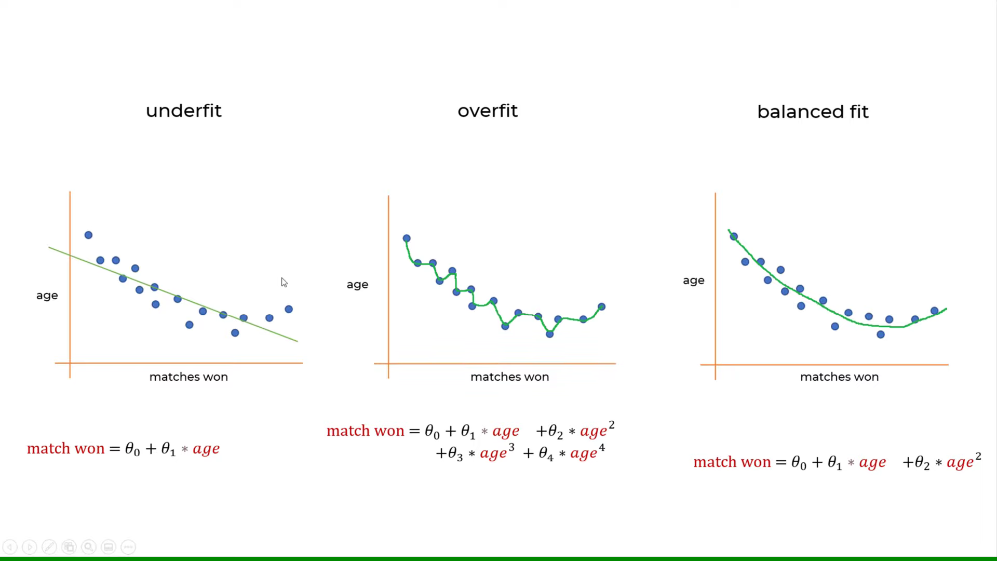)

How to reduce this overfitting...

![codebasics - Machine Learning Tutorial Python - 17 L1 and L2 Regularization Lasso, Ridge Regression [VqKq78PVO9g - 997x561 - 4m37s].png](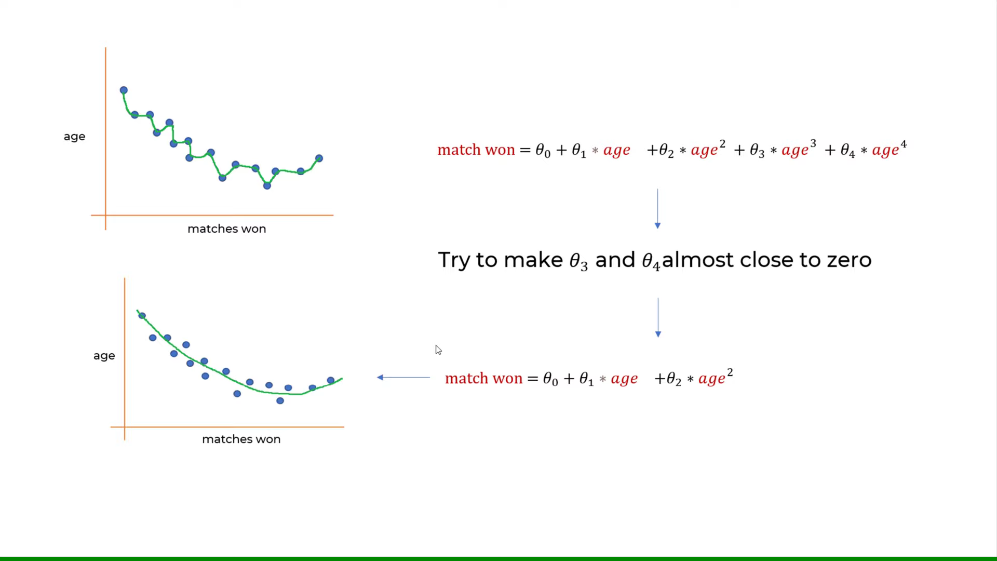)

![codebasics - Machine Learning Tutorial Python - 17 L1 and L2 Regularization Lasso, Ridge Regression [VqKq78PVO9g - 997x561 - 5m19s].png](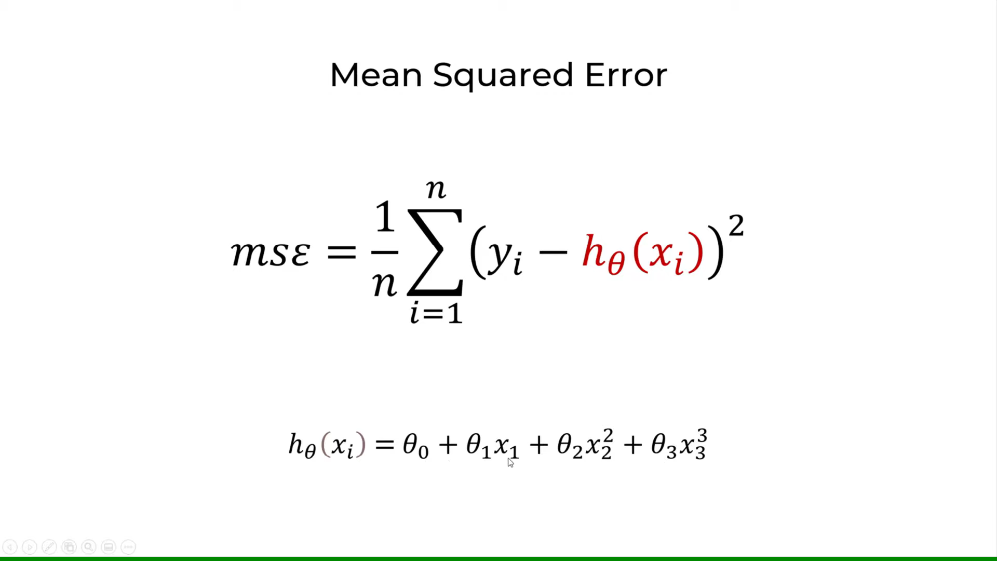)

![codebasics - Machine Learning Tutorial Python - 17 L1 and L2 Regularization Lasso, Ridge Regression [VqKq78PVO9g - 997x561 - 6m18s].png](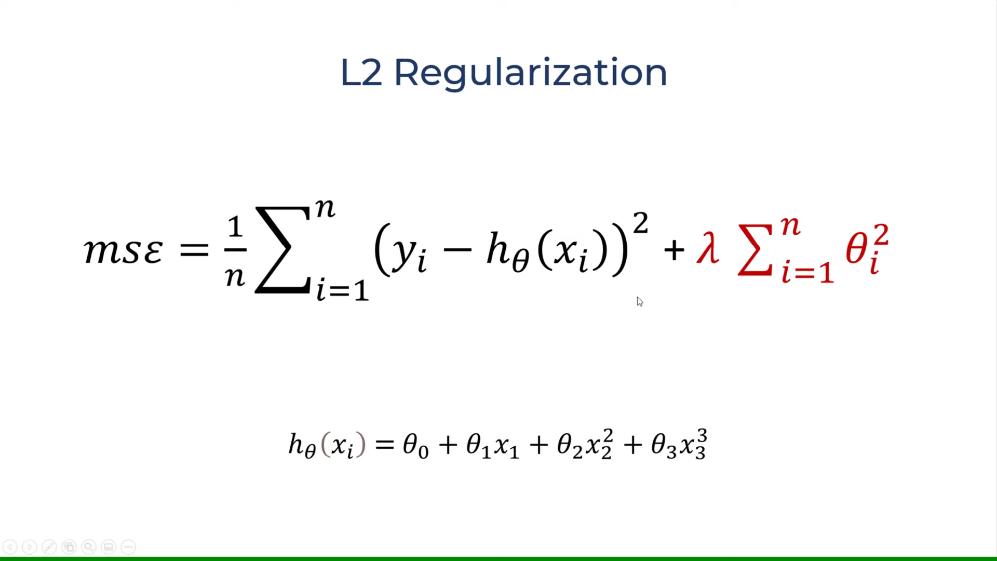)

![codebasics - Machine Learning Tutorial Python - 17 L1 and L2 Regularization Lasso, Ridge Regression [VqKq78PVO9g - 997x561 - 7m09s].png](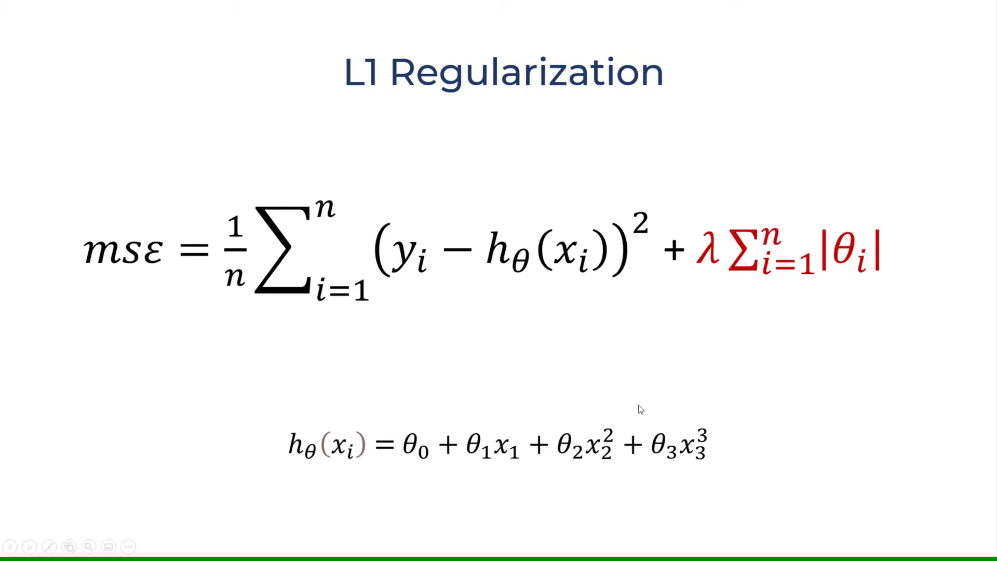)

In L1 and L2 regularization, a penalty term is added to the error (or loss) function. This penalty term is a function of the model's weights or coefficients.

### L1 Regularization (Lasso):
In L1 regularization, also known as Lasso regularization, the penalty term added to the error function is the sum of the absolute values of the model's coefficients multiplied by a regularization parameter (λ or alpha). Mathematically, the L1 regularization term can be represented as:

\[ \text{L1 regularization term} = \lambda \sum_{i=1}^{n} |w_i| \]

Where:
- \( \lambda \) (lambda) is the regularization parameter that controls the strength of regularization.
- \( w_i \) are the coefficients of the model.

### L2 Regularization (Ridge):
In L2 regularization, also known as Ridge regularization, the penalty term added to the error function is the sum of the squared values of the model's coefficients multiplied by a regularization parameter (λ or alpha). Mathematically, the L2 regularization term can be represented as:

\[ \text{L2 regularization term} = \lambda \sum_{i=1}^{n} w_i^2 \]

Where:
- \( \lambda \) (lambda) is the regularization parameter.
- \( w_i \) are the coefficients of the model.

### Impact on Overfitting:
The addition of the regularization term to the error function helps in reducing overfitting by penalizing large values of the model's coefficients. Here's how regularization helps in reducing overfitting:

1. **Control of Model Complexity**: By penalizing large coefficients, regularization discourages the model from fitting the training data too closely, thereby preventing overfitting. It encourages the model to be simpler, favoring smaller coefficients.

2. **Regularization Parameter**: The regularization parameter (\( \lambda \) or alpha) controls the strength of regularization. A higher value of \( \lambda \) results in stronger regularization, leading to a simpler model with smaller coefficients. Tuning this parameter helps in finding the right balance between model complexity and generalization performance.

3. **Feature Selection (L1 Regularization)**: In L1 regularization (Lasso), the penalty term encourages sparsity by driving some coefficients to exactly zero. This can lead to feature selection, where less important features are effectively ignored by the model. It helps in reducing the dimensionality of the feature space and improving model interpretability.

In summary, L1 and L2 regularization techniques help in reducing overfitting by penalizing large coefficients and controlling the complexity of the model. They are effective tools for improving the generalization performance of machine learning models.

Building linear regression model for melborn house prize prediction.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [ ]:
dataset = pd.read_csv("Melbourne_housing_FULL.csv")
dataset.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067.0,...,1.0,1.0,126.0,NaN,NaN,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019.0
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019.0
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019.0
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.5,3067.0,...,2.0,1.0,0.0,NaN,NaN,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019.0


In [ ]:
datasets.nunique()

Suburb             351
Address          34009
Rooms               12
Type                 3
Price             2871
Method               9
SellerG            388
Date                78
Distance           215
Postcode           211
Bedroom2            15
Bathroom            11
Car                 15
Landsize          1684
BuildingArea       740
YearBuilt          160
CouncilArea         33
Lattitude        13402
Longtitude       14524
Regionname           8
Propertycount      342
dtype: int64

In [ ]:
datasets.isnull()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,False,False,False,False,True,False,False,False,False,False,...,False,False,False,True,True,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,True,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,True,False,False,False,False,False,...,False,False,False,True,True,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34852,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,True,False,False,False,False,False
34853,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
34854,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
34855,False,False,False,False,False,False,False,False,False,False,...,True,True,True,True,True,False,True,True,False,False


In [ ]:
dataset.isnull().sum()

Suburb               0
Address              0
Rooms                0
Type                 0
Price             7610
Method               0
SellerG              0
Date                 0
Distance             1
Postcode             1
Bedroom2          8217
Bathroom          8226
Car               8728
Landsize         11810
BuildingArea     21115
YearBuilt        19306
CouncilArea          3
Lattitude         7976
Longtitude        7976
Regionname           3
Propertycount        3
dtype: int64

In [ ]:
dataset.shape

(34857, 21)

In [ ]:
# let's use limited columns which makes more sense for serving our purpose
cols_to_use = ['Suburb', 'Rooms', 'Type', 'Method', 'SellerG', 'Regionname', 'Propertycount',
               'Distance', 'CouncilArea', 'Bedroom2', 'Bathroom', 'Car', 'Landsize', 'BuildingArea', 'Price']
dataset = dataset[cols_to_use]

# Handling Missing values

In [ ]:
# Some feature's missing values can be treated as zero (another class for NA values or absence of that feature)
# like 0 for Propertycount, Bedroom2 will refer to other class of NA values
# like 0 for Car feature will mean that there's no car parking feature with house
cols_to_fill_zero = ['Propertycount', 'Distance', 'Bedroom2', 'Bathroom', 'Car']
dataset[cols_to_fill_zero] = dataset[cols_to_fill_zero].fillna(0)


# other continuous features can be imputed with mean for faster results since our focus is on Reducing overfitting
# using Lasso and Ridge Regression
dataset['Landsize'] = dataset['Landsize'].fillna(dataset.Landsize.mean())
dataset['BuildingArea'] = dataset['BuildingArea'].fillna(dataset.BuildingArea.mean())

Drop NA values of Price, since it's our predictive variable we won't impute it

In [ ]:
dataset.dropna(inplace=True)

In [ ]:
dataset.head()

,Suburb,Rooms,Type,Method,SellerG,Regionname,Propertycount,Distance,CouncilArea,Bedroom2,Bathroom,Car,Landsize,BuildingArea,Price
1,Abbotsford,2,h,S,Biggin,Northern Metropolitan,4019.0,2.5,Yarra City Council,2.0,1.0,1.0,202.0,160.2564,1480000.0
2,Abbotsford,2,h,S,Biggin,Northern Metropolitan,4019.0,2.5,Yarra City Council,2.0,1.0,0.0,156.0,79.0000,1035000.0
4,Abbotsford,3,h,SP,Biggin,Northern Metropolitan,4019.0,2.5,Yarra City Council,3.0,2.0,0.0,134.0,150.0000,1465000.0
5,Abbotsford,3,h,PI,Biggin,Northern Metropolitan,4019.0,2.5,Yarra City Council,3.0,2.0,1.0,94.0,160.2564,850000.0
6,Abbotsford,4,h,VB,Nelson,Northern Metropolitan,4019.0,2.5,Yarra City Council,3.0,1.0,2.0,120.0,142.0000,1600000.0



Let's one hot encode the categorical features

In [ ]:
dataset = pd.get_dummies(dataset, drop_first=True)

In [ ]:
dataset.head()

,Rooms,Propertycount,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,Price,Suburb_Aberfeldie,...,CouncilArea_Moorabool Shire Council,CouncilArea_Moreland City Council,CouncilArea_Nillumbik Shire Council,CouncilArea_Port Phillip City Council,CouncilArea_Stonnington City Council,CouncilArea_Whitehorse City Council,CouncilArea_Whittlesea City Council,CouncilArea_Wyndham City Council,CouncilArea_Yarra City Council,CouncilArea_Yarra Ranges Shire Council
1,2,4019.0,2.5,2.0,1.0,1.0,202.0,160.2564,1480000.0,False,...,False,False,False,False,False,False,False,False,True,False
2,2,4019.0,2.5,2.0,1.0,0.0,156.0,79.0000,1035000.0,False,...,False,False,False,False,False,False,False,False,True,False
4,3,4019.0,2.5,3.0,2.0,0.0,134.0,150.0000,1465000.0,False,...,False,False,False,False,False,False,False,False,True,False
5,3,4019.0,2.5,3.0,2.0,1.0,94.0,160.2564,850000.0,False,...,False,False,False,False,False,False,False,False,True,False
6,4,4019.0,2.5,3.0,1.0,2.0,120.0,142.0000,1600000.0,False,...,False,False,False,False,False,False,False,False,True,False


Don't worry True/False bhi chalega, 0/1 na ho to

Let's bifurcate our dataset into train and test dataset

In [ ]:
X = dataset.drop('Price', axis=1)
y = dataset['Price']

In [ ]:
from sklearn.model_selection import train_test_split
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size=0.3, random_state=2)

Let's train our Linear Regression Model on training dataset and check the accuracy on test set

In [ ]:
from sklearn.linear_model import LinearRegression
reg = LinearRegression().fit(train_X, train_y)

In [ ]:
reg.score(test_X, test_y)

0.13853683161639851

In [ ]:
reg.score(train_X, train_y)

0.6827792395792723

Clearly overfitting.



Here training score is 68% but test score is 13.85% which is very low

Normal Regression is clearly overfitting the data, let's try other models

Using Lasso (L1 Regularized) Regression Model

In [ ]:
from sklearn import linear_model
lasso_reg = linear_model.Lasso(alpha=50, max_iter=1000, tol=0.1)
lasso_reg.fit(train_X, train_y)

Lasso(alpha=50, tol=0.1)

In [ ]:
lasso_reg.score(test_X, test_y)

0.6636280170612745

In [ ]:
lasso_reg.score(train_X, train_y)

0.6767149418617553

Using Ridge (L2 Regularized) Regression Model

In [ ]:
from sklearn.linear_model import Ridge
ridge_reg= Ridge(alpha=50, max_iter=100, tol=0.1)
ridge_reg.fit(train_X, train_y)

Ridge(alpha=50, max_iter=100, tol=0.1)

In [ ]:
ridge_reg.score(test_X, test_y)

0.6670848945194958

In [ ]:
ridge_reg.score(train_X, train_y)

0.6622376739684328

We see that Lasso and Ridge Regularizations prove to be beneficial when our Simple Linear Regression Model overfits. These results may not be that contrast but significant in most cases.Also that L1 & L2 Regularizations are used in Neural Networks too

**L19. K-Nearest Neighbours Classifier**

![codebasics - Machine Learning Tutorial Python - 18 K nearest neighbors classification with python code [CQveSaMyEwM - 997x561 - 0m31s].png](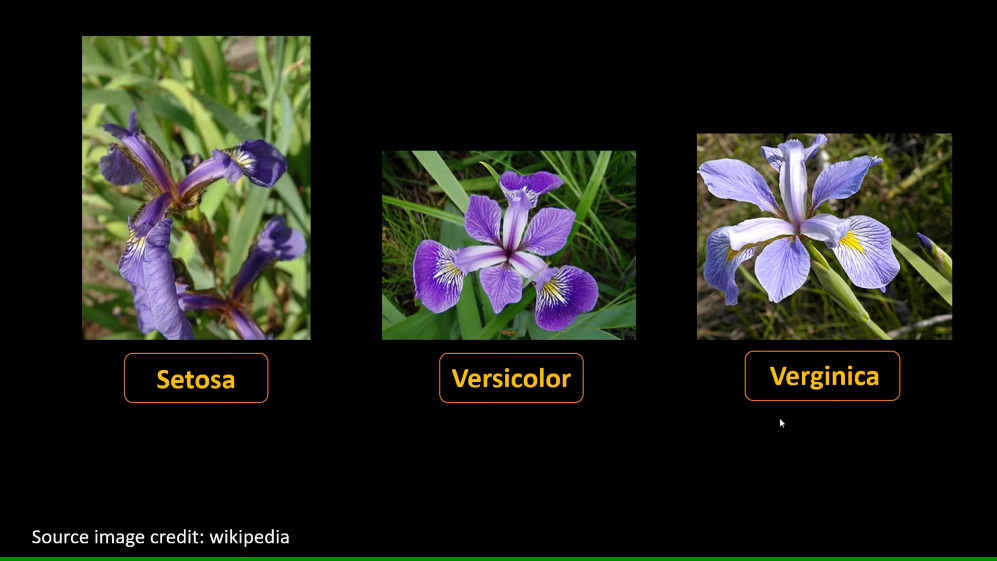)

![codebasics - Machine Learning Tutorial Python - 18 K nearest neighbors classification with python code [CQveSaMyEwM - 997x561 - 0m53s].png](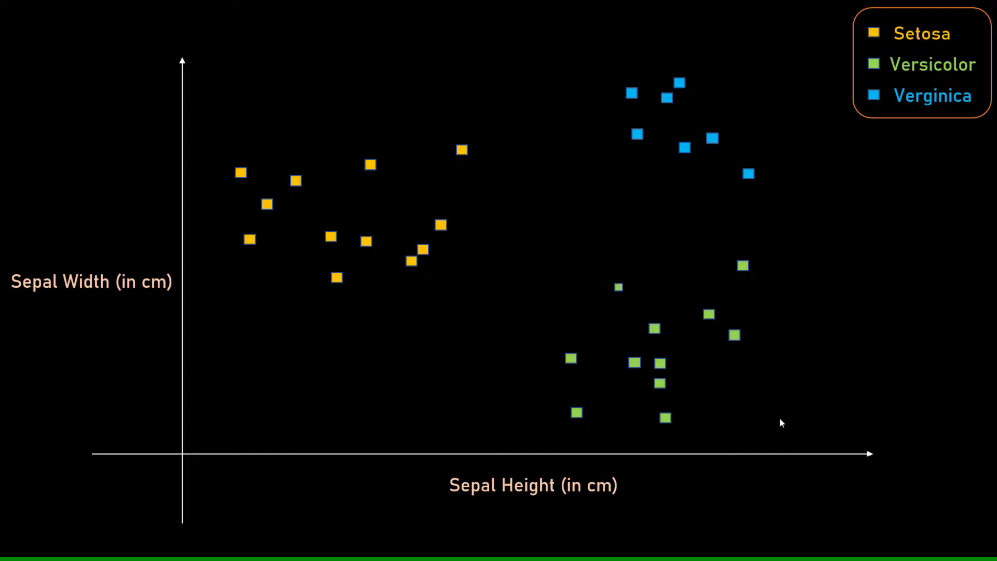)

We have done it previously by k-means clustering, that was a unsuparwised ml algorithm.

K-nearest neighbour algorithm is Superwised ml algorithm

![codebasics - Machine Learning Tutorial Python - 18 K nearest neighbors classification with python code [CQveSaMyEwM - 997x561 - 2m09s].png](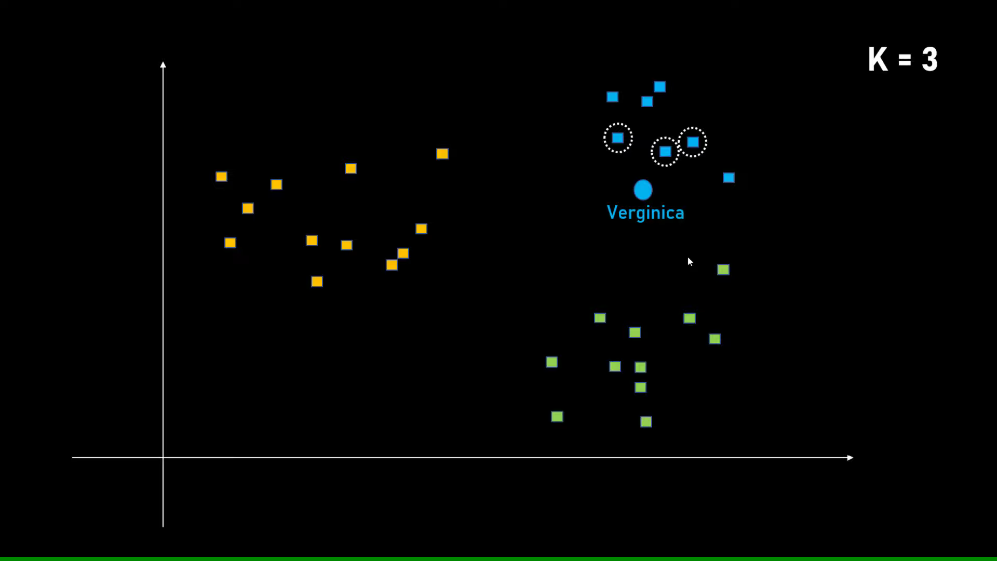)

![codebasics - Machine Learning Tutorial Python - 18 K nearest neighbors classification with python code [CQveSaMyEwM - 997x561 - 2m31s].png](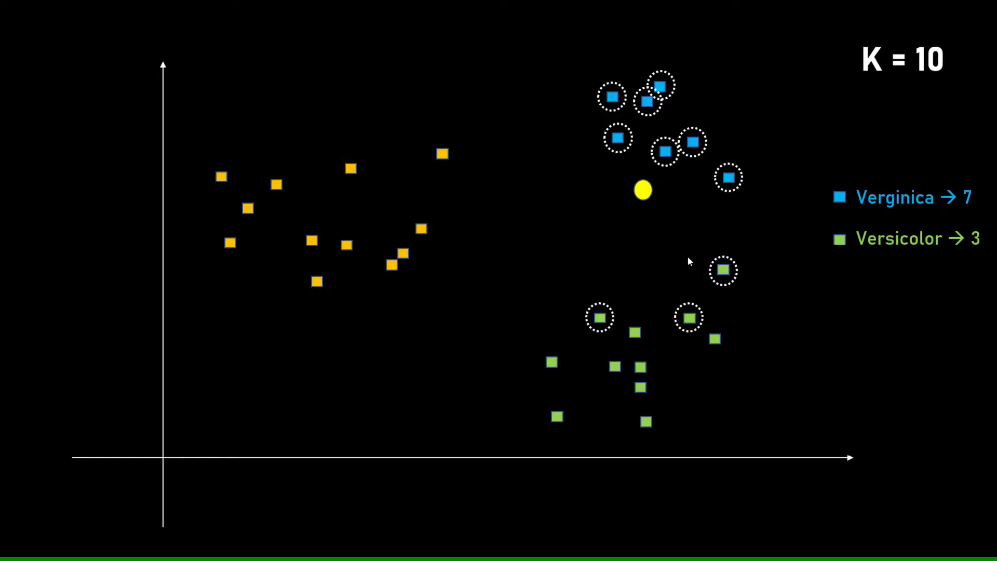)

above two chosen k are fine and classifying the model a=correctly.

But the below is wrong: It is misclassifying the new data-point.

![codebasics - Machine Learning Tutorial Python - 18 K nearest neighbors classification with python code [CQveSaMyEwM - 997x561 - 3m15s].png](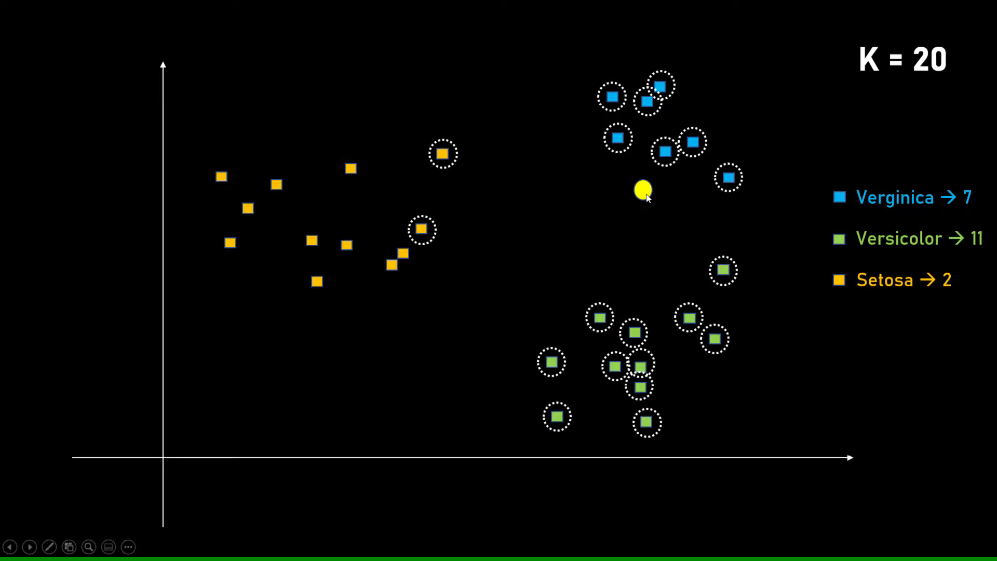)

![codebasics - Machine Learning Tutorial Python - 18 K nearest neighbors classification with python code [CQveSaMyEwM - 997x561 - 3m21s].png](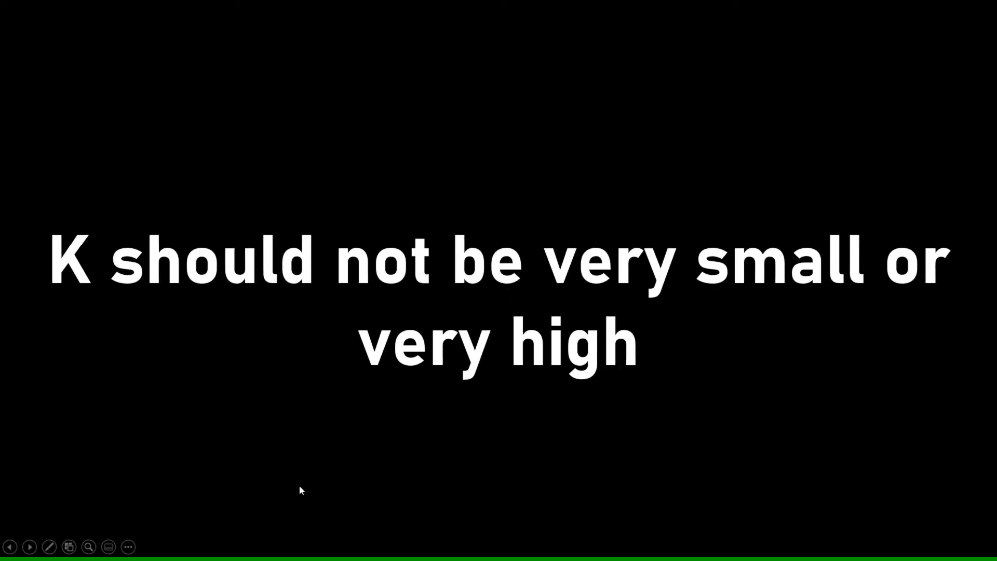)

In [ ]:
import pandas as pd
from sklearn.datasets import load_iris
iris = load_iris()

In [ ]:
iris.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [ ]:
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [ ]:
df = pd.DataFrame(iris.data, columns=iris.feature_names)
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [ ]:
df['target'] = iris.target
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [ ]:
df[df.target==1].head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
50,7.0,3.2,4.7,1.4,1
51,6.4,3.2,4.5,1.5,1
52,6.9,3.1,4.9,1.5,1
53,5.5,2.3,4.0,1.3,1
54,6.5,2.8,4.6,1.5,1


In [ ]:
df[df.target==2].head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
100,6.3,3.3,6.0,2.5,2
101,5.8,2.7,5.1,1.9,2
102,7.1,3.0,5.9,2.1,2
103,6.3,2.9,5.6,1.8,2
104,6.5,3.0,5.8,2.2,2


In [ ]:
df0 = df[:50]
df1 = df[50:100]
df2 = df[100:]

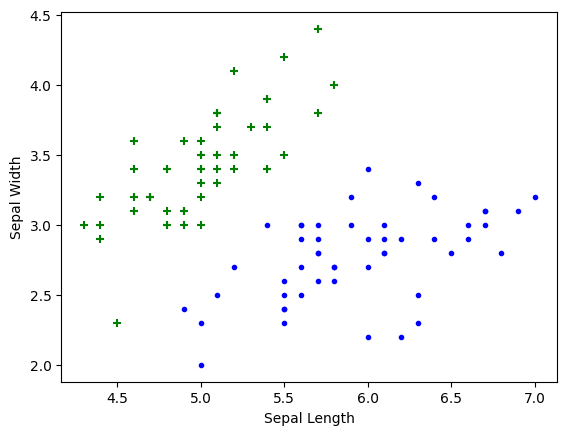

In [ ]:
import matplotlib.pyplot as plt
plt.xlabel('Sepal Length')
plt.ylabel('Sepal Width')
plt.scatter(df0['sepal length (cm)'], df0['sepal width (cm)'],color="green",marker='+')
plt.scatter(df1['sepal length (cm)'], df1['sepal width (cm)'],color="blue",marker='.')

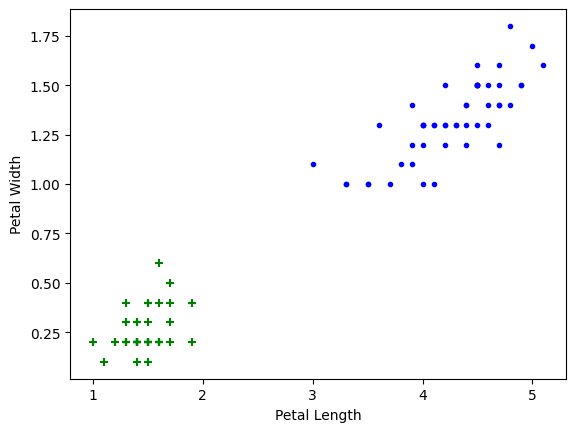

In [ ]:
# Petal length vs Pepal Width (Setosa vs Versicolor)
plt.xlabel('Petal Length')
plt.ylabel('Petal Width')
plt.scatter(df0['petal length (cm)'], df0['petal width (cm)'],color="green",marker='+')
plt.scatter(df1['petal length (cm)'], df1['petal width (cm)'],color="blue",marker='.')

In [ ]:
# Train test split
from sklearn.model_selection import train_test_split
X = df.drop(['target'], axis='columns')
y = df.target

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [ ]:
len(X_train), len(X_test)

(120, 30)

# Create k-nearest neighbour classifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
knn.score(X_train, y_train)

0.95

In [ ]:
knn.score(X_test, y_test)

1.0

with different values of k, we will get different scores.  We try to find out the optimal k.

Confusion matrix : for which classes it got thre predictions right and for which classes it got the predictions wrong.

In [ ]:
from sklearn.metrics import confusion_matrix

y_pred = knn.predict(X_test)

cm = confusion_matrix(y_test,y_pred)
cm

array([[11,  0,  0],
       [ 0, 13,  0],
       [ 0,  0,  6]])

Test me since accuracy 100 % aa gyi thi, so test vale pr confusion matrix keval principal diagonal chhodkar baki sara 0 degi.

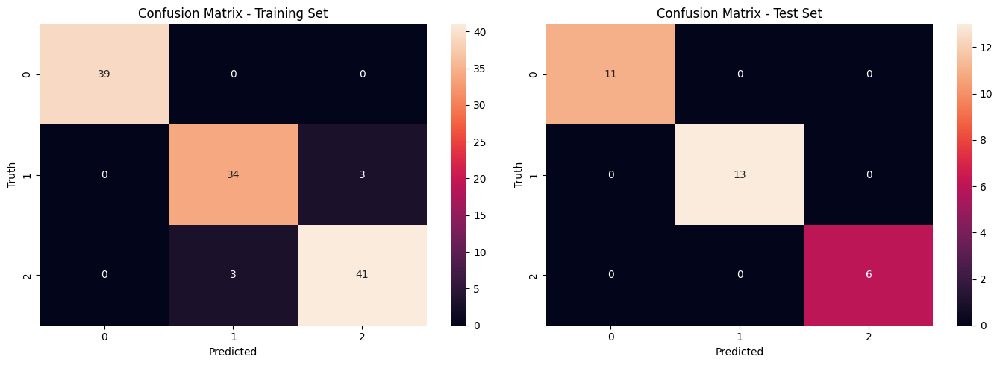

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Create subplots for side-by-side heatmaps
plt.figure(figsize=(14, 5))

# Plot the confusion matrix for the training set
plt.subplot(1, 2, 1)
y_pred = knn.predict(X_train)
sns.heatmap(confusion_matrix(y_train, y_pred), annot=True)
plt.title('Confusion Matrix - Training Set')
plt.xlabel('Predicted')
plt.ylabel('Truth')

# Plot the confusion matrix for the test set
plt.subplot(1, 2, 2)
y_pred = knn.predict(X_test)
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True)
plt.title('Confusion Matrix - Test Set')
plt.xlabel('Predicted')
plt.ylabel('Truth')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

This non-ideal result for train vs test is because of very less data points and not uniform distribution of samples of any category in train and test datasets.

At the same time let's try stratify parameters in train test split for equal proportion of categories in train as well as test.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, stratify=y)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
knn.score(X_train, y_train)

0.9583333333333334

In [ ]:
knn.score(X_test, y_test)

0.9666666666666667

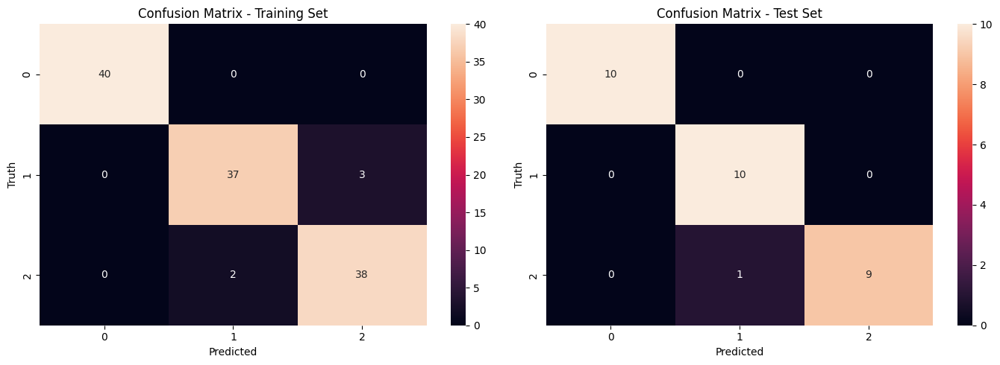

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Create subplots for side-by-side heatmaps
plt.figure(figsize=(14, 5))

# Plot the confusion matrix for the training set
plt.subplot(1, 2, 1)
y_pred = knn.predict(X_train)
sns.heatmap(confusion_matrix(y_train, y_pred), annot=True)
plt.title('Confusion Matrix - Training Set')
plt.xlabel('Predicted')
plt.ylabel('Truth')

# Plot the confusion matrix for the test set
plt.subplot(1, 2, 2)
y_pred = knn.predict(X_test)
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True)
plt.title('Confusion Matrix - Test Set')
plt.xlabel('Predicted')
plt.ylabel('Truth')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

Se now equal proportion devision of samples.

**Print classification report for precesion, recall and f1-score for each classes**

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       0.91      1.00      0.95        10
           2       1.00      0.90      0.95        10

    accuracy                           0.97        30
   macro avg       0.97      0.97      0.97        30
weighted avg       0.97      0.97      0.97        30



# L 19 : Principal Component Analysis.

to reduce the dimension

ex1. Regression (house price prediction)

![codebasics - Machine Learning Tutorial Python - 19 Principal Component Analysis (PCA) with Python Code [8klqIM9UvAc - 997x561 - 0m23s].png](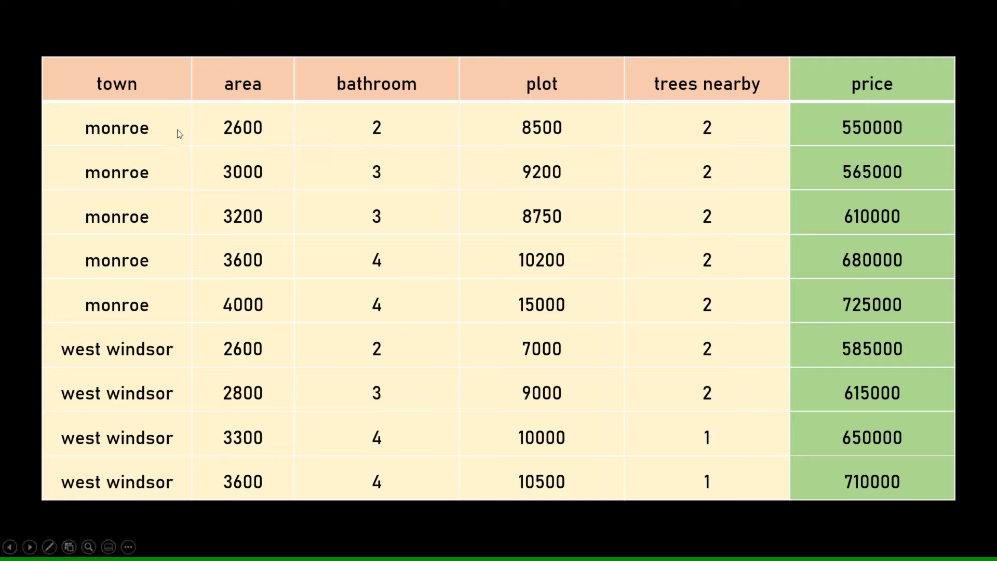)

ex2. (handwritten digit classification)

![codebasics - Machine Learning Tutorial Python - 19 Principal Component Analysis (PCA) with Python Code [8klqIM9UvAc - 997x561 - 3m08s].png](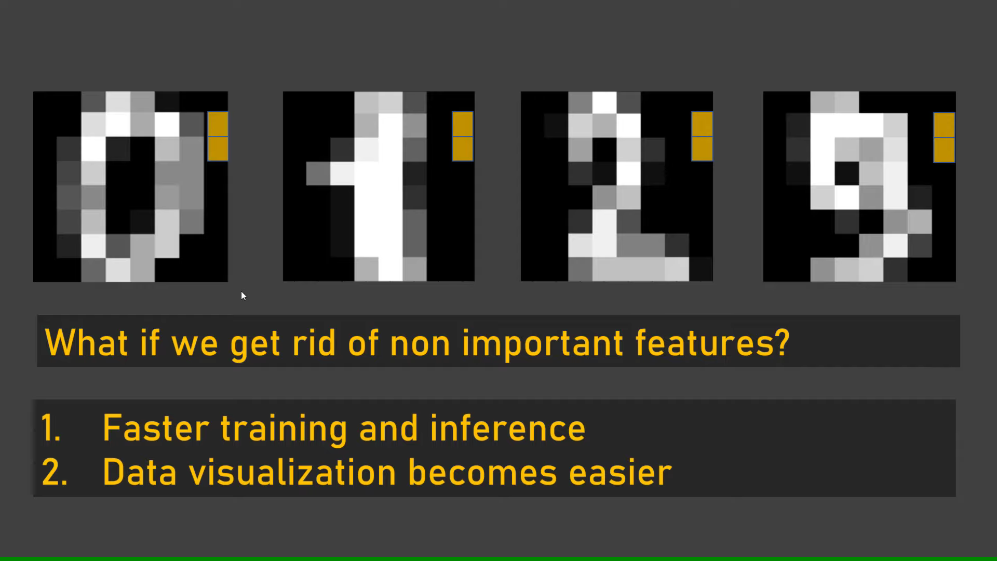)

![codebasics - Machine Learning Tutorial Python - 19 Principal Component Analysis (PCA) with Python Code [8klqIM9UvAc - 997x561 - 3m50s].png](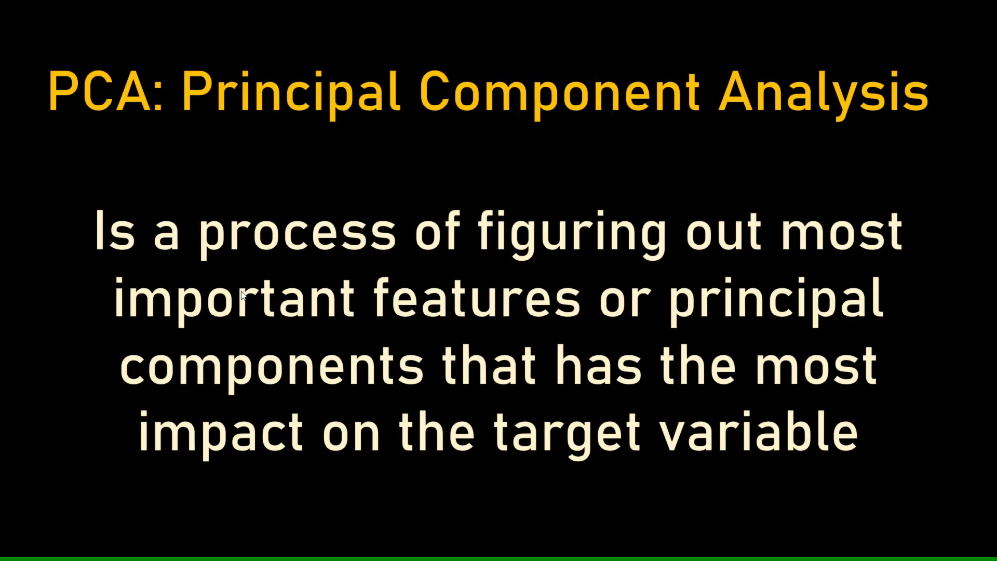)

The new features are called : Principal Components : PC1, PC2 PC3 .... PCn

here corner pixels are not playing any role, they can be reduced.

![codebasics - Machine Learning Tutorial Python - 19 Principal Component Analysis (PCA) with Python Code [8klqIM9UvAc - 997x561 - 4m51s].png](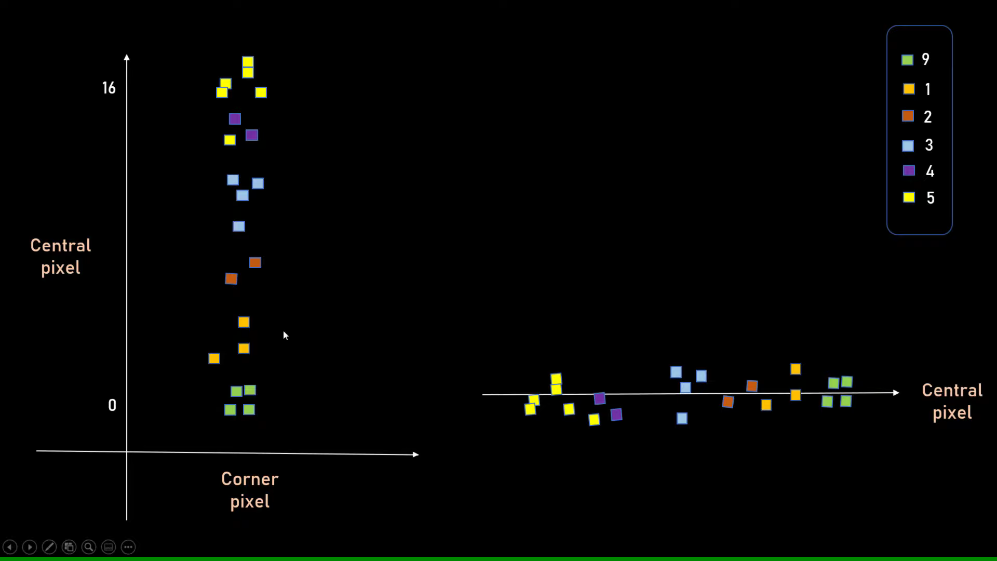)

![codebasics - Machine Learning Tutorial Python - 19 Principal Component Analysis (PCA) with Python Code [8klqIM9UvAc - 997x561 - 5m38s].png](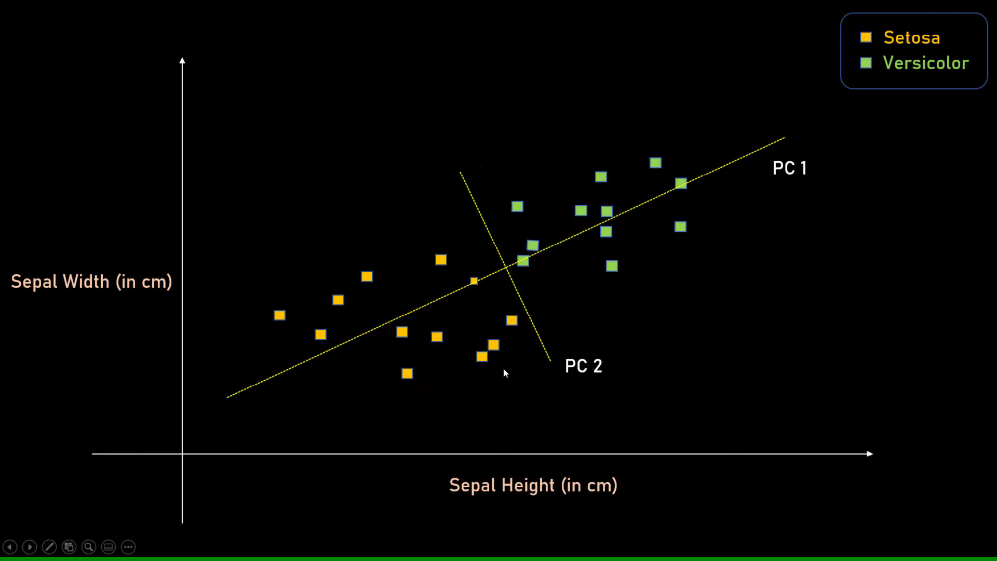)

![codebasics - Machine Learning Tutorial Python - 19 Principal Component Analysis (PCA) with Python Code [8klqIM9UvAc - 997x561 - 5m47s].png](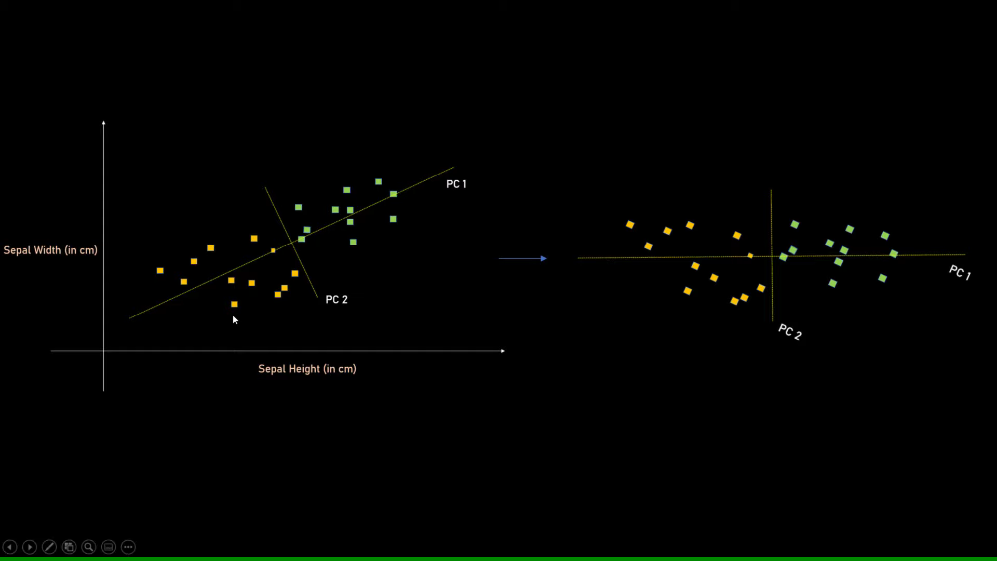)

PC1 : the best fitting line : explains most of the variance.

PC2 : the best fitting line perpendicular to PC1 explains the 2nd highest variance.

PC3 : best fitting line perpendicular to PC1, PC2 and it explains the 3rd highest variance... similarly so on.


PC(n_components=6) : calculate the 6 most important features = these 6 features explains the most of the variance. ( 1 to n in the descending order of their impact on the original dataframe)

In other words **"More variance explaination = More information Capture"**

Hence PC1 contains most of the informations, then PC2 then PC3 and so on.

![codebasics - Machine Learning Tutorial Python - 19 Principal Component Analysis (PCA) with Python Code [8klqIM9UvAc - 997x561 - 6m53s].png](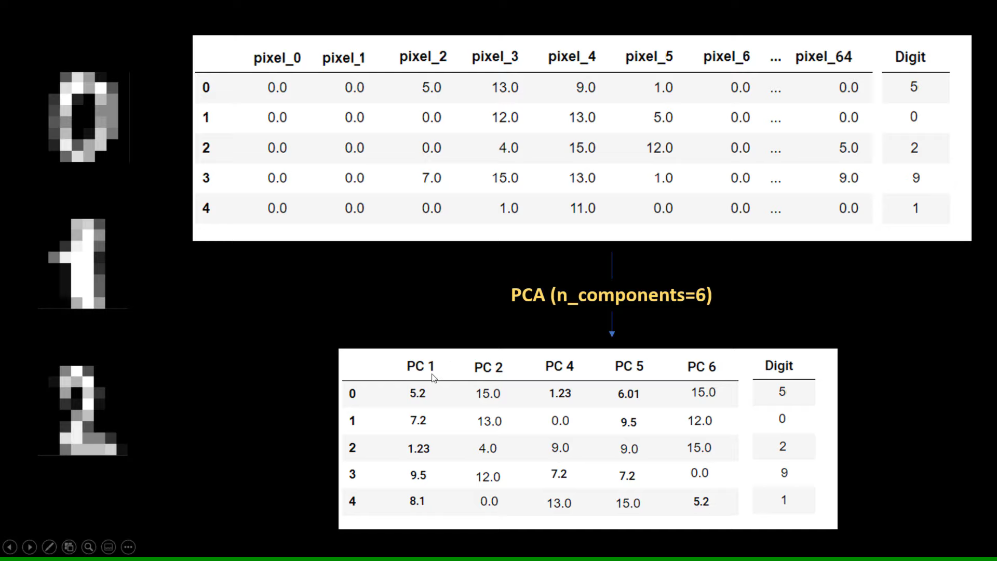)

![codebasics - Machine Learning Tutorial Python - 19 Principal Component Analysis (PCA) with Python Code [8klqIM9UvAc - 997x561 - 8m13s].png](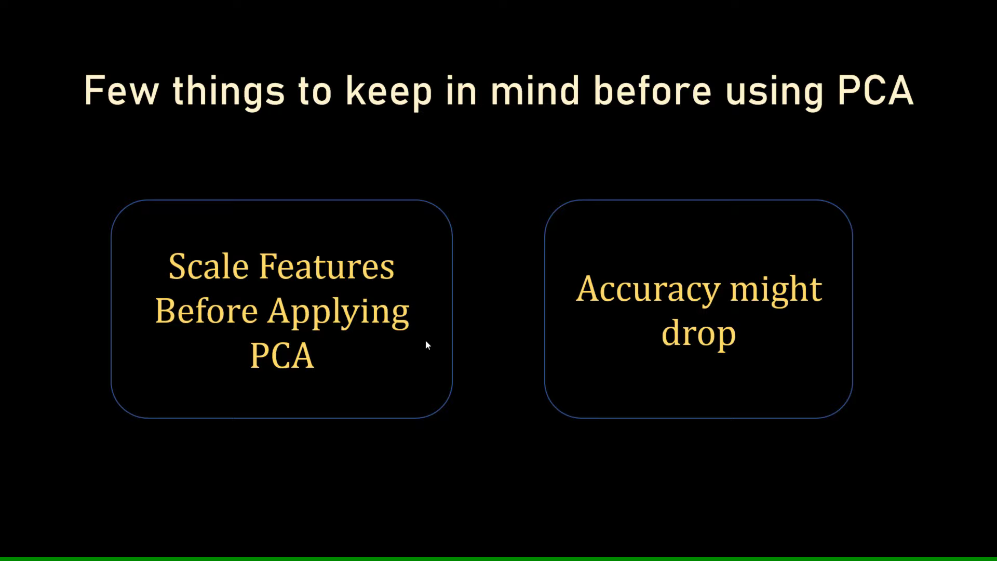)

![codebasics - Machine Learning Tutorial Python - 19 Principal Component Analysis (PCA) with Python Code [8klqIM9UvAc - 997x561 - 8m53s].png](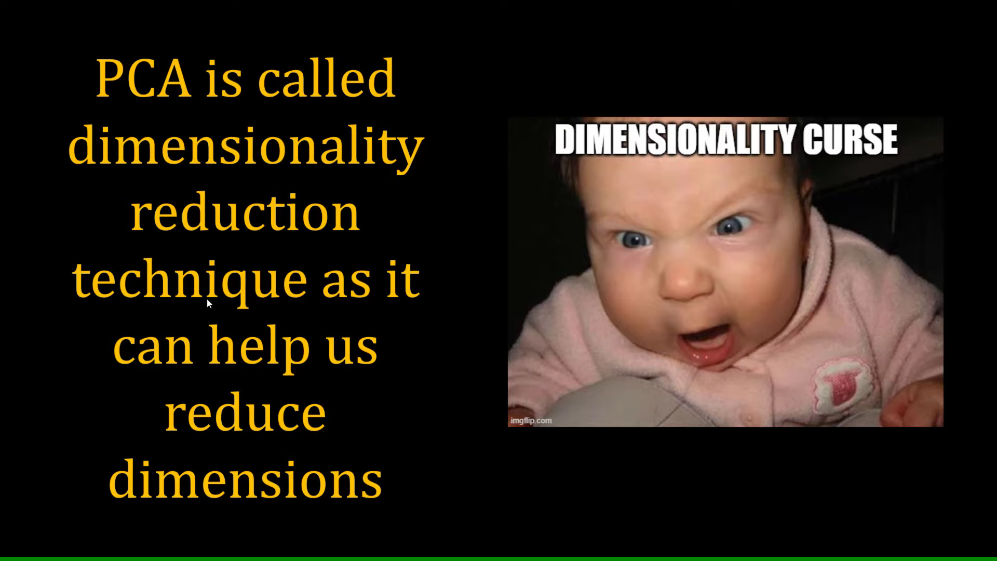)

In [ ]:
import pandas as pd
from sklearn.datasets import load_digits

In [ ]:
dataset = load_digits()
dataset

{'data': array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ..., 10.,  0.,  0.],
        [ 0.,  0.,  0., ..., 16.,  9.,  0.],
        ...,
        [ 0.,  0.,  1., ...,  6.,  0.,  0.],
        [ 0.,  0.,  2., ..., 12.,  0.,  0.],
        [ 0.,  0., 10., ..., 12.,  1.,  0.]]),
 'target': array([0, 1, 2, ..., 8, 9, 8]),
 'frame': None,
 'feature_names': ['pixel_0_0',
  'pixel_0_1',
  'pixel_0_2',
  'pixel_0_3',
  'pixel_0_4',
  'pixel_0_5',
  'pixel_0_6',
  'pixel_0_7',
  'pixel_1_0',
  'pixel_1_1',
  'pixel_1_2',
  'pixel_1_3',
  'pixel_1_4',
  'pixel_1_5',
  'pixel_1_6',
  'pixel_1_7',
  'pixel_2_0',
  'pixel_2_1',
  'pixel_2_2',
  'pixel_2_3',
  'pixel_2_4',
  'pixel_2_5',
  'pixel_2_6',
  'pixel_2_7',
  'pixel_3_0',
  'pixel_3_1',
  'pixel_3_2',
  'pixel_3_3',
  'pixel_3_4',
  'pixel_3_5',
  'pixel_3_6',
  'pixel_3_7',
  'pixel_4_0',
  'pixel_4_1',
  'pixel_4_2',
  'pixel_4_3',
  'pixel_4_4',
  'pixel_4_5',
  'pixel_4_6',
  'pixel_4_7',
  'pixel_5_0',
  'pixel_5_1',
 

In [ ]:
dataset.data.shape

(1797, 64)

1797 samples/images with 64 features of pixels in form of 1D (arready flattened 2d array) array form.

In [ ]:
dataset.data[0]

array([ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.,  0.,  0., 13., 15., 10.,
       15.,  5.,  0.,  0.,  3., 15.,  2.,  0., 11.,  8.,  0.,  0.,  4.,
       12.,  0.,  0.,  8.,  8.,  0.,  0.,  5.,  8.,  0.,  0.,  9.,  8.,
        0.,  0.,  4., 11.,  0.,  1., 12.,  7.,  0.,  0.,  2., 14.,  5.,
       10., 12.,  0.,  0.,  0.,  0.,  6., 13., 10.,  0.,  0.,  0.])

Gives the values of all the 64 features of the first image.

In [ ]:
# lets plot the image, for that we need image in 2D matrix 8x8 pixel format.

In [ ]:
dataset.data[0].reshape(8,8)

array([[ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.],
       [ 0.,  0., 13., 15., 10., 15.,  5.,  0.],
       [ 0.,  3., 15.,  2.,  0., 11.,  8.,  0.],
       [ 0.,  4., 12.,  0.,  0.,  8.,  8.,  0.],
       [ 0.,  5.,  8.,  0.,  0.,  9.,  8.,  0.],
       [ 0.,  4., 11.,  0.,  1., 12.,  7.,  0.],
       [ 0.,  2., 14.,  5., 10., 12.,  0.,  0.],
       [ 0.,  0.,  6., 13., 10.,  0.,  0.,  0.]])

<Figure size 640x480 with 0 Axes>

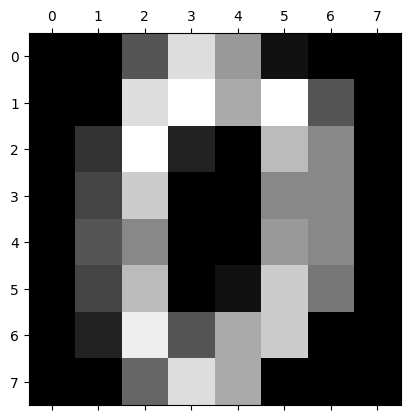

In [ ]:
from matplotlib import pyplot as plt
plt.gray()
plt.matshow(dataset.data[0].reshape(8,8))

In [ ]:
dataset.target

array([0, 1, 2, ..., 8, 9, 8])

classes for each 1797 datapoints.

In [ ]:
import numpy as np
np.unique(dataset.target)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [ ]:
dataset.target[44]

7

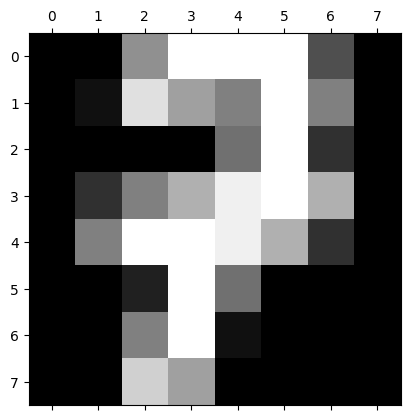

In [ ]:
plt.matshow(dataset.data[44].reshape(8,8))

<Figure size 400x400 with 0 Axes>

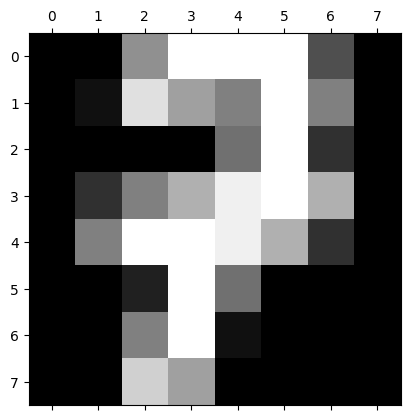

In [ ]:
# Set the size of the figure
plt.figure(figsize=(4, 4))  # Adjust the size as needed

# Plot the image using plt.matshow()
plt.matshow(dataset.data[44].reshape(8, 8))

<Figure size 300x100 with 0 Axes>

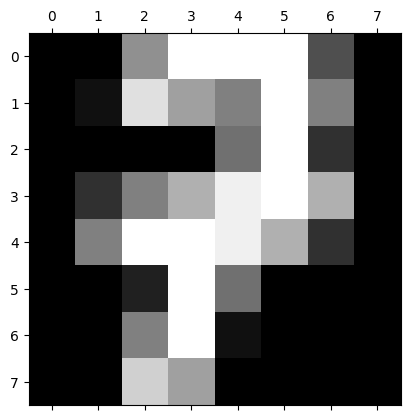

In [ ]:
# Set the size of the figure
plt.figure(figsize=(3, 1))  # Adjust the size as needed

# Plot the image using plt.matshow()
plt.matshow(dataset.data[44].reshape(8, 8))

Kuch bhi change kr lo bhai, hr barsame hi size aa rha hai.

In [ ]:
dataset.data.shape

(1797, 64)

In [ ]:
type(dataset.data)

numpy.ndarray

In [ ]:
pd.DataFrame(dataset.data) # that will create a dataframe of the dataset.data, which is a 2D array
# pd.DataFrame(2D array name)

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1792,0.0,0.0,4.0,10.0,13.0,6.0,0.0,0.0,0.0,1.0,...,4.0,0.0,0.0,0.0,2.0,14.0,15.0,9.0,0.0,0.0
1793,0.0,0.0,6.0,16.0,13.0,11.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,6.0,16.0,14.0,6.0,0.0,0.0
1794,0.0,0.0,1.0,11.0,15.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,9.0,13.0,6.0,0.0,0.0
1795,0.0,0.0,2.0,10.0,7.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,5.0,12.0,16.0,12.0,0.0,0.0


In [ ]:
dataset.feature_names

['pixel_0_0',
 'pixel_0_1',
 'pixel_0_2',
 'pixel_0_3',
 'pixel_0_4',
 'pixel_0_5',
 'pixel_0_6',
 'pixel_0_7',
 'pixel_1_0',
 'pixel_1_1',
 'pixel_1_2',
 'pixel_1_3',
 'pixel_1_4',
 'pixel_1_5',
 'pixel_1_6',
 'pixel_1_7',
 'pixel_2_0',
 'pixel_2_1',
 'pixel_2_2',
 'pixel_2_3',
 'pixel_2_4',
 'pixel_2_5',
 'pixel_2_6',
 'pixel_2_7',
 'pixel_3_0',
 'pixel_3_1',
 'pixel_3_2',
 'pixel_3_3',
 'pixel_3_4',
 'pixel_3_5',
 'pixel_3_6',
 'pixel_3_7',
 'pixel_4_0',
 'pixel_4_1',
 'pixel_4_2',
 'pixel_4_3',
 'pixel_4_4',
 'pixel_4_5',
 'pixel_4_6',
 'pixel_4_7',
 'pixel_5_0',
 'pixel_5_1',
 'pixel_5_2',
 'pixel_5_3',
 'pixel_5_4',
 'pixel_5_5',
 'pixel_5_6',
 'pixel_5_7',
 'pixel_6_0',
 'pixel_6_1',
 'pixel_6_2',
 'pixel_6_3',
 'pixel_6_4',
 'pixel_6_5',
 'pixel_6_6',
 'pixel_6_7',
 'pixel_7_0',
 'pixel_7_1',
 'pixel_7_2',
 'pixel_7_3',
 'pixel_7_4',
 'pixel_7_5',
 'pixel_7_6',
 'pixel_7_7']

don't know on which basis header names have been picked, but koi nhi kuch bhi feature name hain, but hain to 64 that's fine for all the 64 pixels.

oh haan, yaad aaya **since it is 8x8 image, pixel_6_7 means 7th row and 8th column pixel value.  similarly pixel_i_j means (i+1)th row and (j+1)th column pixel value. Also notice i and j belong to [0,7]**

In [ ]:
type(dataset.feature_names)

list

Clearly 2D array me to koi column name nhi hota hai, so default index 0 to 63 tk assign ho gye column names. So let's assign column/header names, which are stored in a list named `dataset.feature_names`

In [ ]:
pd.DataFrame(dataset.data, columns=dataset.feature_names)

,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_1_0,pixel_1_1,...,pixel_6_6,pixel_6_7,pixel_7_0,pixel_7_1,pixel_7_2,pixel_7_3,pixel_7_4,pixel_7_5,pixel_7_6,pixel_7_7
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1792,0.0,0.0,4.0,10.0,13.0,6.0,0.0,0.0,0.0,1.0,...,4.0,0.0,0.0,0.0,2.0,14.0,15.0,9.0,0.0,0.0
1793,0.0,0.0,6.0,16.0,13.0,11.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,6.0,16.0,14.0,6.0,0.0,0.0
1794,0.0,0.0,1.0,11.0,15.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,2.0,9.0,13.0,6.0,0.0,0.0
1795,0.0,0.0,2.0,10.0,7.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,5.0,12.0,16.0,12.0,0.0,0.0


In [ ]:
df = pd.DataFrame(dataset.data, columns=dataset.feature_names)
df.head()

,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_1_0,pixel_1_1,...,pixel_6_6,pixel_6_7,pixel_7_0,pixel_7_1,pixel_7_2,pixel_7_3,pixel_7_4,pixel_7_5,pixel_7_6,pixel_7_7
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0


In [ ]:
df.describe()

,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_1_0,pixel_1_1,...,pixel_6_6,pixel_6_7,pixel_7_0,pixel_7_1,pixel_7_2,pixel_7_3,pixel_7_4,pixel_7_5,pixel_7_6,pixel_7_7
count,1797.0,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000,...,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000,1797.000000
mean,0.0,0.303840,5.204786,11.835838,11.848080,5.781859,1.362270,0.129661,0.005565,1.993879,...,3.725097,0.206455,0.000556,0.279354,5.557596,12.089037,11.809126,6.764051,2.067891,0.364496
std,0.0,0.907192,4.754826,4.248842,4.287388,5.666418,3.325775,1.037383,0.094222,3.196160,...,4.919406,0.984401,0.023590,0.934302,5.103019,4.374694,4.933947,5.900623,4.090548,1.860122
min,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.0,0.000000,1.000000,10.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,11.000000,10.000000,0.000000,0.000000,0.000000
50%,0.0,0.000000,4.000000,13.000000,13.000000,4.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,4.000000,13.000000,14.000000,6.000000,0.000000,0.000000
75%,0.0,0.000000,9.000000,15.000000,15.000000,11.000000,0.000000,0.000000,0.000000,3.000000,...,7.000000,0.000000,0.000000,0.000000,10.000000,16.000000,16.000000,12.000000,2.000000,0.000000
max,0.0,8.000000,16.000000,16.000000,16.000000,16.000000,16.000000,15.000000,2.000000,16.000000,...,16.000000,13.000000,1.000000,9.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000


Just to know min and max for columns and other statistics

In [ ]:
df.isnull().sum()

pixel_0_0    0
pixel_0_1    0
pixel_0_2    0
pixel_0_3    0
pixel_0_4    0
            ..
pixel_7_3    0
pixel_7_4    0
pixel_7_5    0
pixel_7_6    0
pixel_7_7    0
Length: 64, dtype: int64

In [ ]:
df.isnull().sum().sum()

0

In [ ]:
X = df
y = dataset.target

In [ ]:
X.head()

,pixel_0_0,pixel_0_1,pixel_0_2,pixel_0_3,pixel_0_4,pixel_0_5,pixel_0_6,pixel_0_7,pixel_1_0,pixel_1_1,...,pixel_6_6,pixel_6_7,pixel_7_0,pixel_7_1,pixel_7_2,pixel_7_3,pixel_7_4,pixel_7_5,pixel_7_6,pixel_7_7
0,0.0,0.0,5.0,13.0,9.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,13.0,10.0,0.0,0.0,0.0
1,0.0,0.0,0.0,12.0,13.0,5.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,11.0,16.0,10.0,0.0,0.0
2,0.0,0.0,0.0,4.0,15.0,12.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,0.0,3.0,11.0,16.0,9.0,0.0
3,0.0,0.0,7.0,15.0,13.0,1.0,0.0,0.0,0.0,8.0,...,9.0,0.0,0.0,0.0,7.0,13.0,13.0,9.0,0.0,0.0
4,0.0,0.0,0.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,16.0,4.0,0.0,0.0


In [ ]:
y

array([0, 1, 2, ..., 8, 9, 8])

Before performing PCA, doing scale of dataset is important.

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler() # it will scale all the cell values by x-mu/sigma , for mu and sigma of the corresponding columns
X_scaled = scaler.fit_transform(X) # fit_transform = fit(find mu and sigma for each columns) + transform(apply the scalling on each of the columns)

In [ ]:
X_scaled

array([[ 0.        , -0.33501649, -0.04308102, ..., -1.14664746,
        -0.5056698 , -0.19600752],
       [ 0.        , -0.33501649, -1.09493684, ...,  0.54856067,
        -0.5056698 , -0.19600752],
       [ 0.        , -0.33501649, -1.09493684, ...,  1.56568555,
         1.6951369 , -0.19600752],
       ...,
       [ 0.        , -0.33501649, -0.88456568, ..., -0.12952258,
        -0.5056698 , -0.19600752],
       [ 0.        , -0.33501649, -0.67419451, ...,  0.8876023 ,
        -0.5056698 , -0.19600752],
       [ 0.        , -0.33501649,  1.00877481, ...,  0.8876023 ,
        -0.26113572, -0.19600752]])

since X was 2D array, obviously output will also be 2D array with all the columns with scaled values.

In [ ]:
# after scalling, now train test split
# this time train test split is made on 2D array instead of 2d dataframe. Both ways are fine for train_test_split fuction

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=30)

In [ ]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)
model.score(X_test, y_test)

0.9722222222222222

# Now let's do PCA

In [58]:
from sklearn.decomposition import PCA

pca = PCA(0.95) # it will retain 95% of the useful features/variation/information. It is another way where you are not explicitly saying I want only 2 dimension(by n_dimensions=2) or anything

X_pca = pca.fit_transform(X_scaled) # pased scaled X, it will fit (find the required parameters for PCA) and then transform means apply estimated parameters to get new dataframe with another set of features, as directed having as many number or columns so that 95% variations in the original data will be expalined by those new feature sets

X_pca.shape

(1797, 40)

So now from 64 to 40, dimensionality is reduced and that is good in computer power POV.

In [59]:
X_pca

array([[ 1.91421366, -0.95450157, -3.94603482, ...,  0.81405925,
         0.0249306 ,  0.32193146],
       [ 0.58898033,  0.9246358 ,  3.92475494, ...,  0.20026094,
         0.08710843, -0.48914299],
       [ 1.30203906, -0.31718883,  3.02333293, ..., -0.214596  ,
        -1.2788745 ,  0.54583387],
       ...,
       [ 1.02259599, -0.14791087,  2.46997365, ...,  0.60136463,
         0.41238798,  1.20886377],
       [ 1.07605522, -0.38090625, -2.45548693, ...,  0.43756556,
        -0.69863483, -0.44339963],
       [-1.25770233, -2.22759088,  0.28362789, ..., -0.38108638,
         0.12855104,  1.32137195]])

It is not that it will pick any 40 columns out of 64, actually it will analyze all the columns and calculate new column from it.

In [60]:
pca.explained_variance_ratio_

array([0.12033916, 0.09561054, 0.08444415, 0.06498408, 0.04860155,
       0.0421412 , 0.03942083, 0.03389381, 0.02998221, 0.02932003,
       0.02781805, 0.02577055, 0.02275303, 0.0222718 , 0.02165229,
       0.01914167, 0.01775547, 0.01638069, 0.0159646 , 0.01489191,
       0.0134797 , 0.01271931, 0.01165837, 0.01057647, 0.00975316,
       0.00944559, 0.00863014, 0.00836643, 0.00797693, 0.00746471,
       0.00725582, 0.00691911, 0.00653909, 0.00640793, 0.00591384,
       0.00571162, 0.00523637, 0.00481808, 0.00453719, 0.00423163])

Will tell you ki kitne percentage variation ko kis pca dvara explain kiya gya hai.

First column or PC1 is capturing 12 % variation, PC2(2nd column) is explaining 9 % of the variations. and so on.

In [61]:
pca.n_components

0.95

In [ ]:
pca.n_components_

40

will tell you the number of PCs it has created.

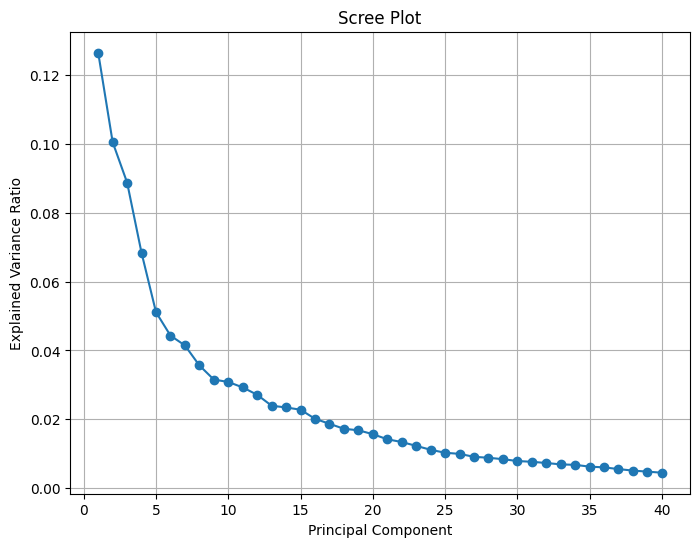

In [62]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming X_pca is your PCA-transformed data and y_pca are the corresponding labels

# Calculate the explained variance ratio
explained_variance_ratio = np.var(X_pca, axis=0) / np.sum(np.var(X_pca, axis=0))

# Plot the scree plot
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='-')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

Now training model on the PCA features and let's see the accuracy.

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=30)

In [ ]:
model = LogisticRegression()
model.fit(X_train_pca,y_train)
model.score(X_test_pca,y_test)

0.9638888888888889

Almost same accuracy.

# Now creating pca by supplying explicitly the number of prinpcipal components:



In [ ]:
pca = PCA(n_components=2)

X_pca = pca.fit_transform(X_scaled)

In [ ]:
X_pca.shape

(1797, 2)

In [ ]:
X_pca

array([[ 1.91421438, -0.95448693],
       [ 0.5889824 ,  0.92464552],
       [ 1.30204194, -0.31713183],
       ...,
       [ 1.02259199, -0.14790474],
       [ 1.07605876, -0.38088545],
       [-1.25770935, -2.22760493]])

Just a 1797 x 2 , 2D array

In [ ]:
# but did it capture enough informations?
pca.explained_variance_ratio_

array([0.12033916, 0.09561054])

So it has just captured 21 % informations

So naturaly when you train model on this dataset, accuracy is gonna be very low.

In [ ]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=30)

model = LogisticRegression()
model.fit(X_train_pca,y_train)
model.score(X_test_pca,y_test)

0.5666666666666667

So just 56 % accuracy.

# L20 : Bias vs Variance

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 0m59s].png](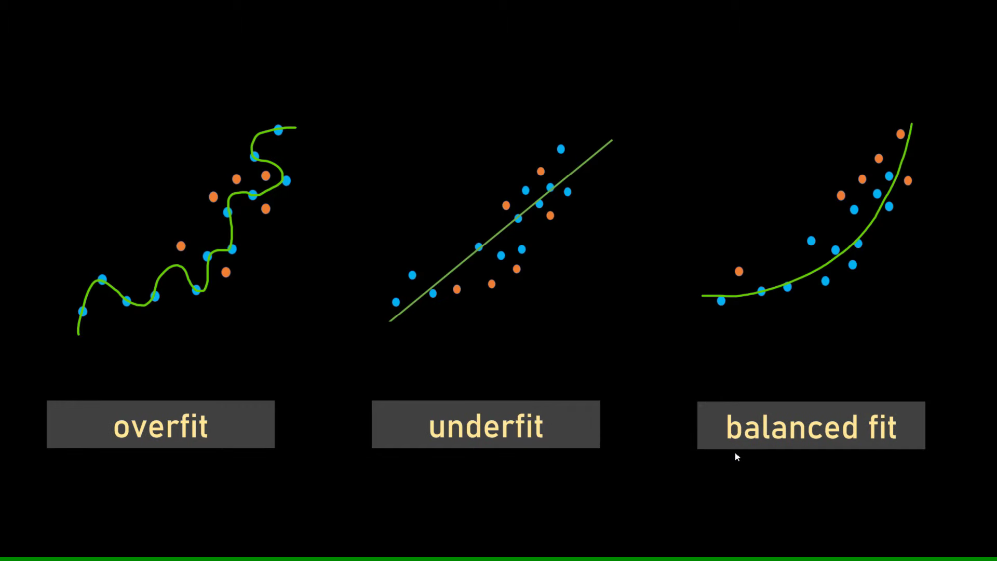)

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 1m35s].png](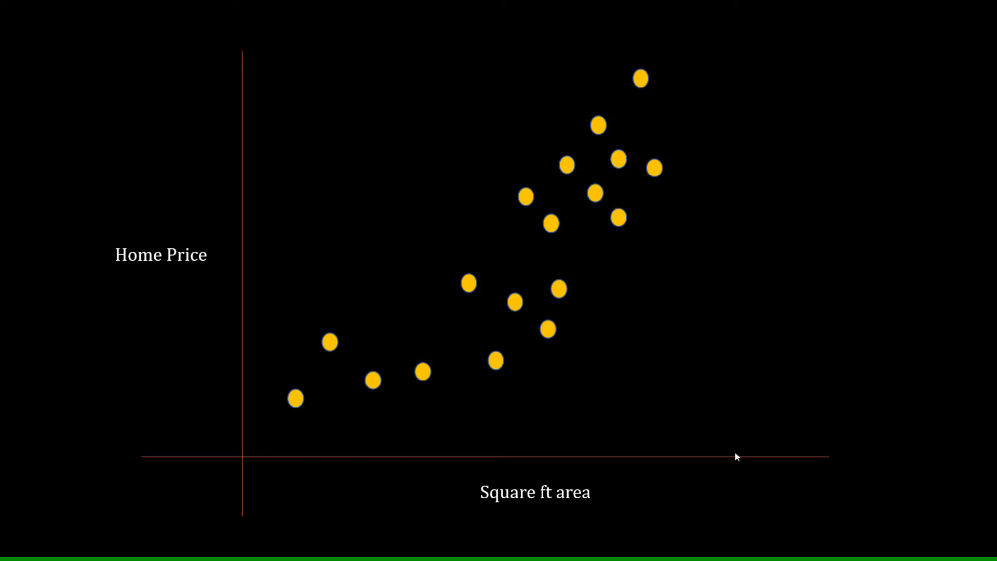)

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 1m48s].png](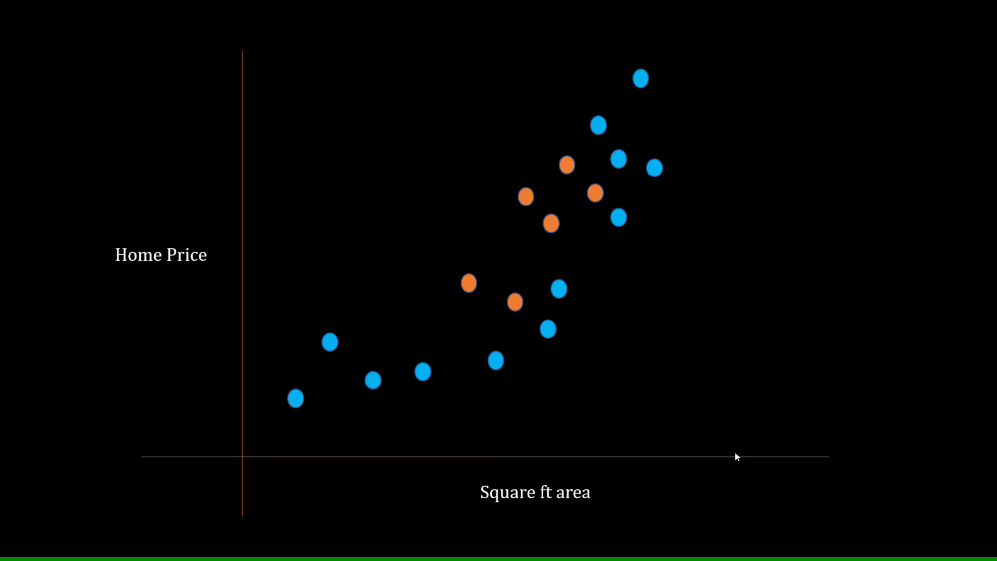)

Blue dots - training and red dots - test points.

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 2m16s].png](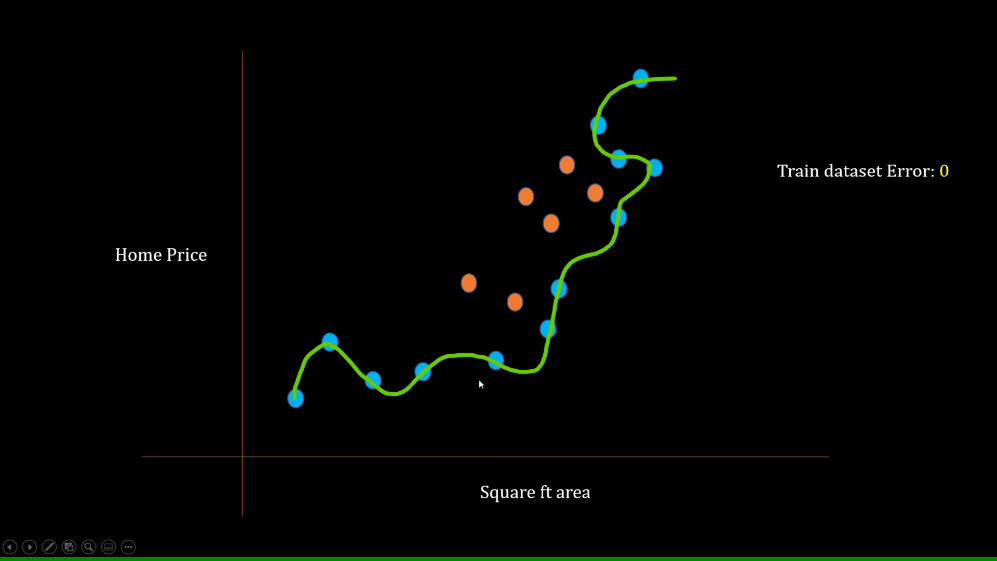)

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 2m38s].png](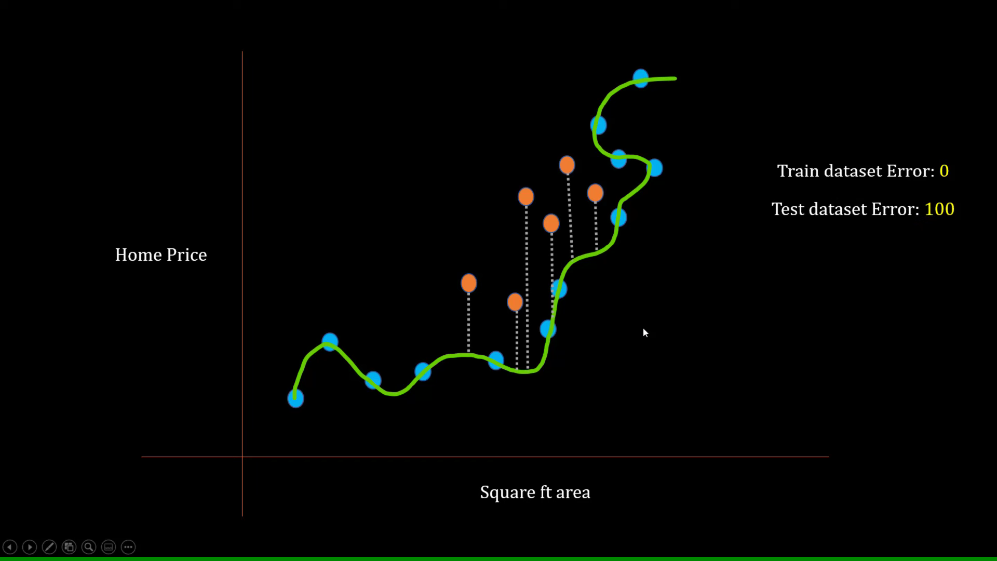)

Since picked training sample at random.. So possibility of chosing different training set

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 3m20s].png](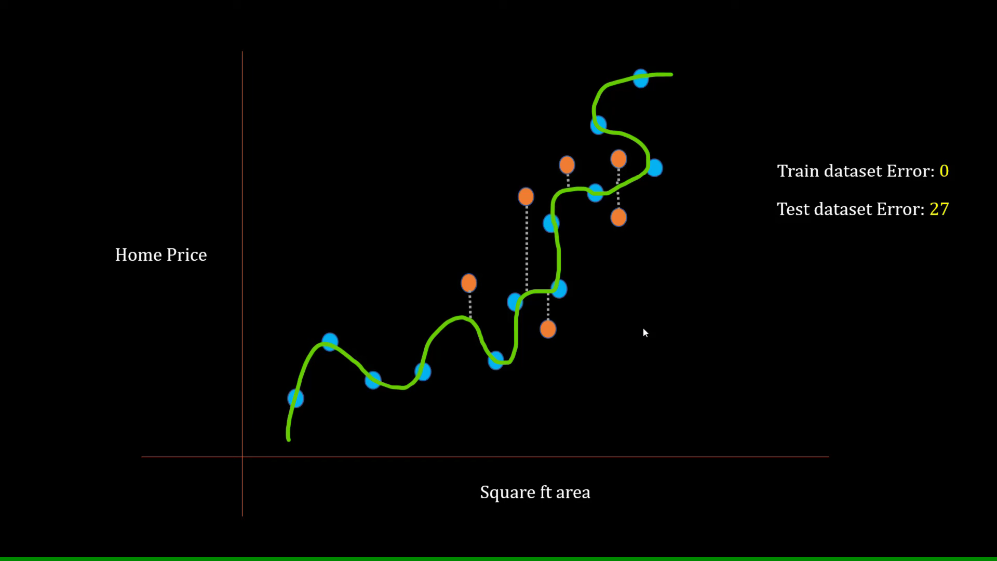)

Test Error varies greatly based on your selection of data-points for training and testing.. And this is called High-Variance. Because there is high variability based on seection of test dataset.

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 4m31s].png](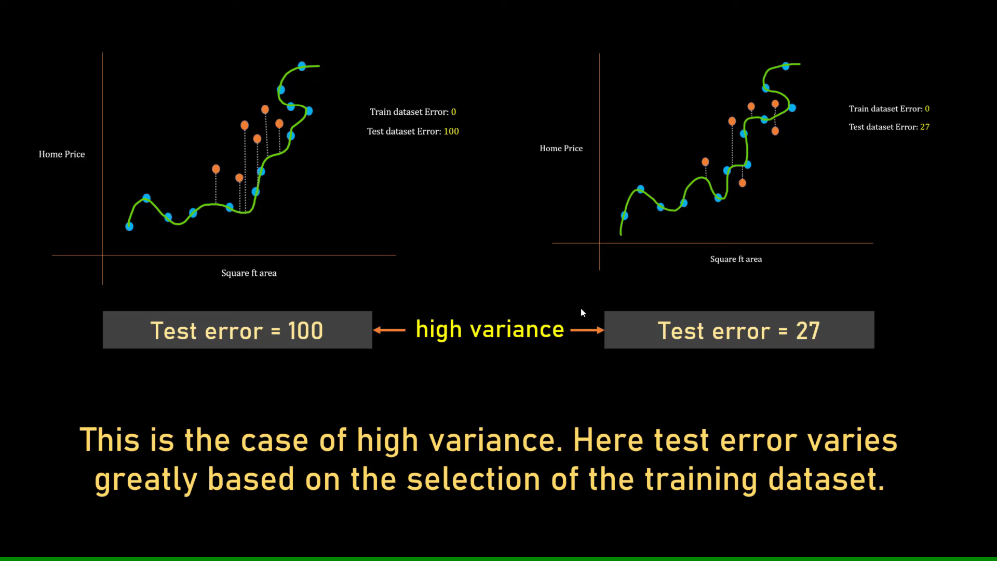)

**In case if we try to fit vary simple model like strainght line:which is underfitting training sample**

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 5m22s].png](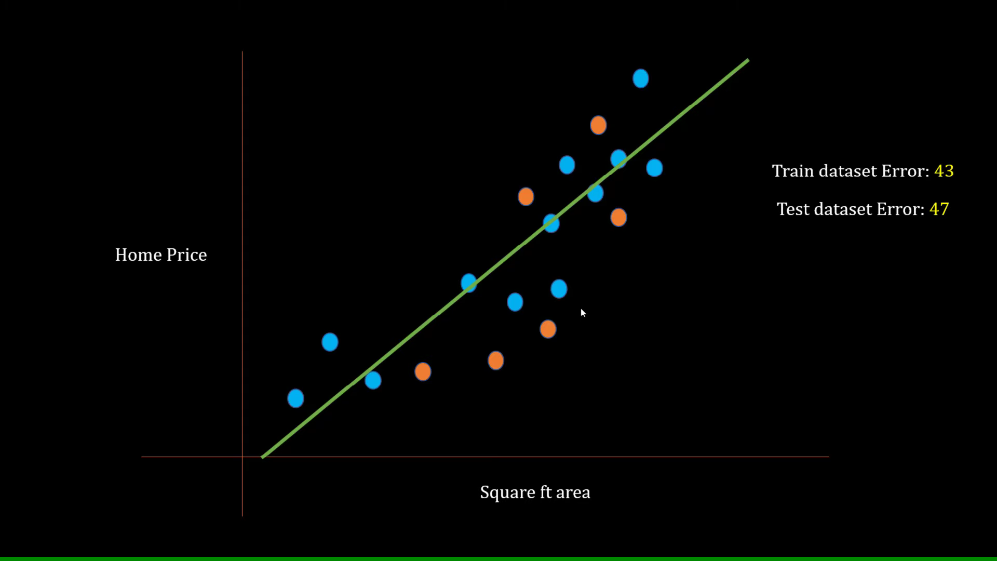)

When you select different set of triaining and test datapoints:

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 5m45s].png](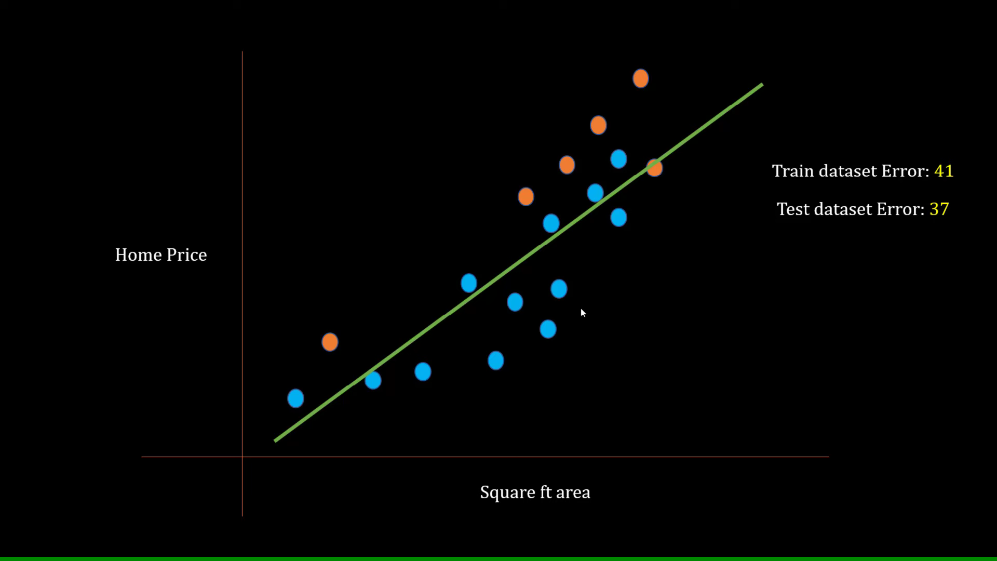)

In both the cases, with linear regression model, the error on test datasets are more or less same. So there is very less variability in the test error when the model underfits.

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 6m34s].png](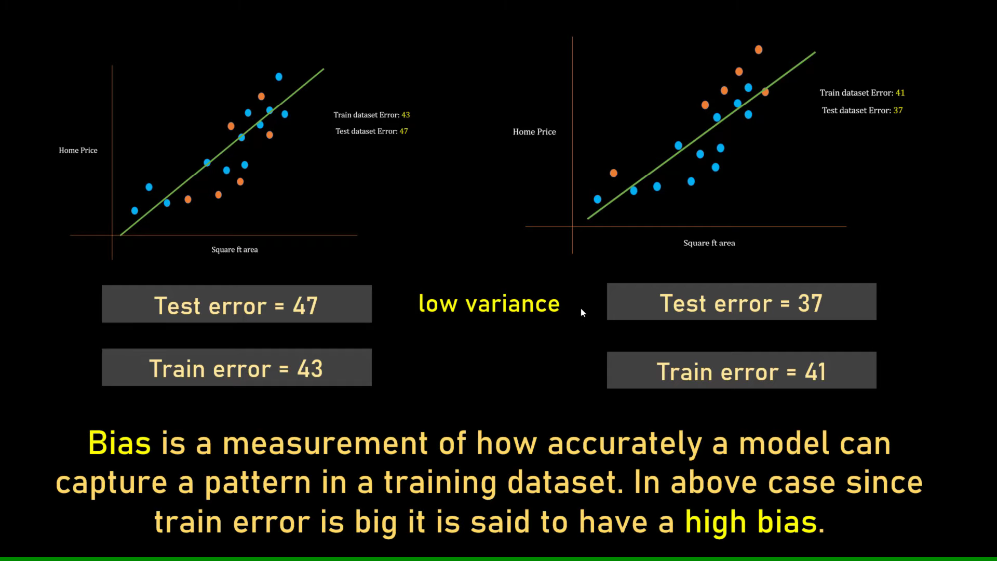)

Previosly, when we have overfit the model, the train error was 0 => Low or 0 bias

SO

1. **High training error = High Bias**
2. **change in test error with choise of train and test samples is very high = high variance**
3. **So low variance = test error remains the same with choice of train and test samples**
4. **Overfit = High variance** (of test errors with choice of train and test datasets)
5. **underfit = Low variance** (of test error with choice of train and test datasets) **+ high bias** ( high test error)


**If model selection is such that both the train and test error are low = low variance and low bias model**

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 7m35s].png](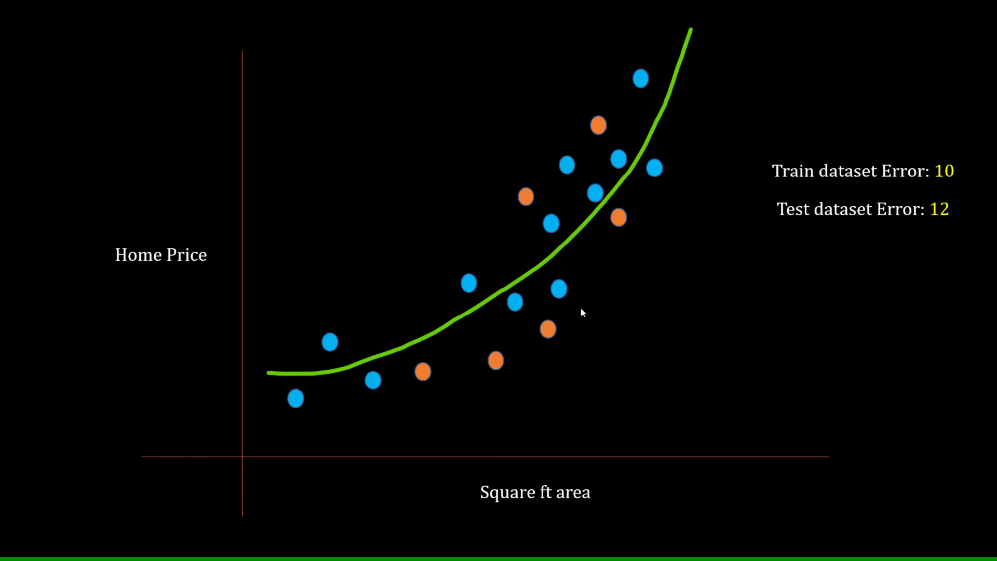)

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 7m41s].png](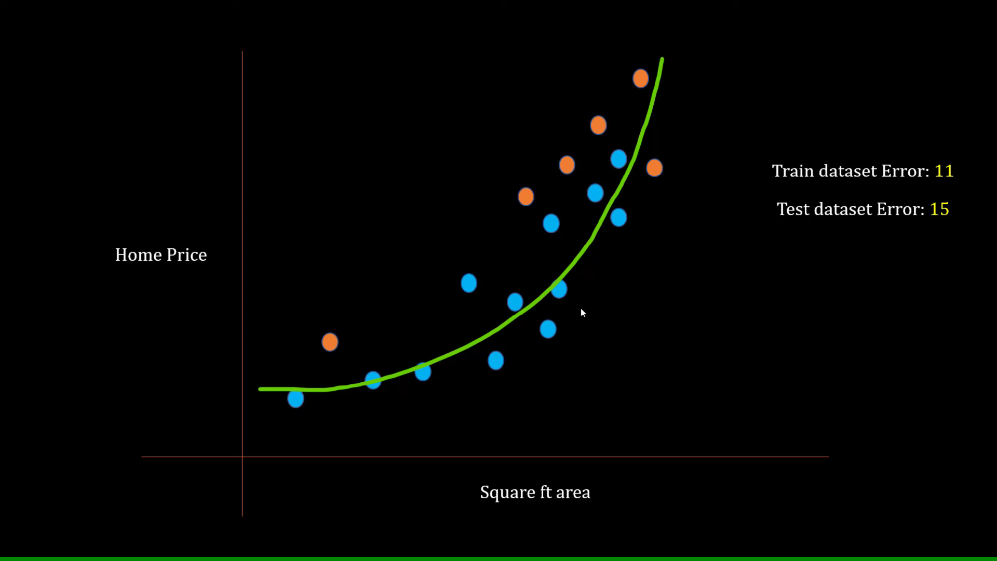)

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 7m52s].png](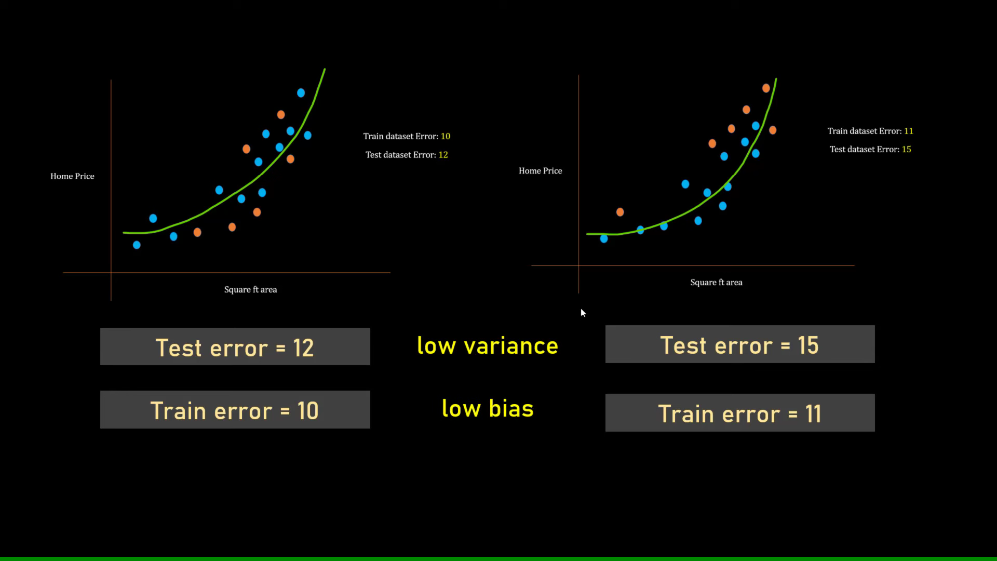)

Low Variance + Low Bias model = best model =
1. low variance = test error does not varry much based on what training and test samples you have selected.
2. Low bias = Training error in general is low.

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 8m16s].png](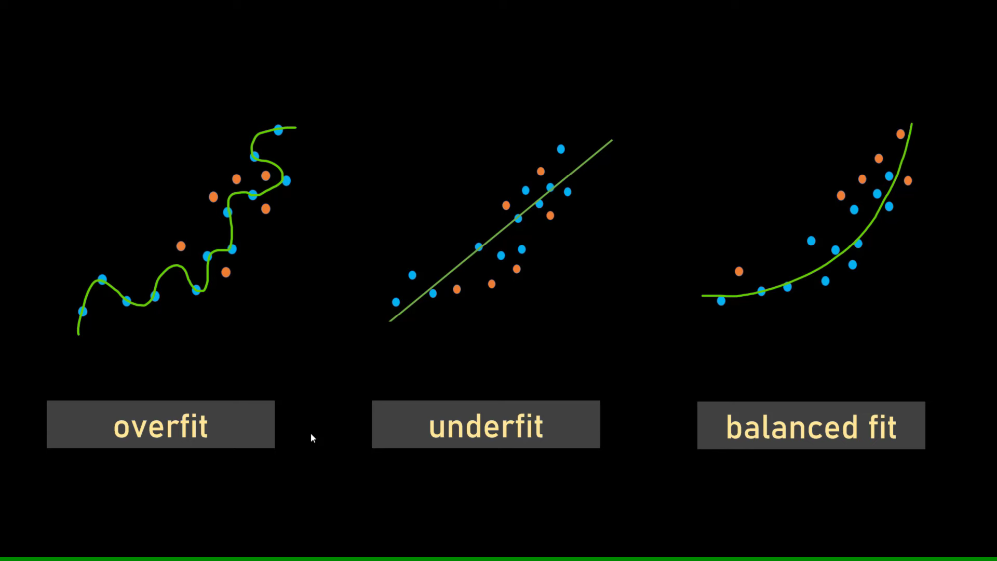)

generally, likely:
1. overfit = High variance
2. underfit = high bias
3. balance fit = low variance and low bias

![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 9m58s].png](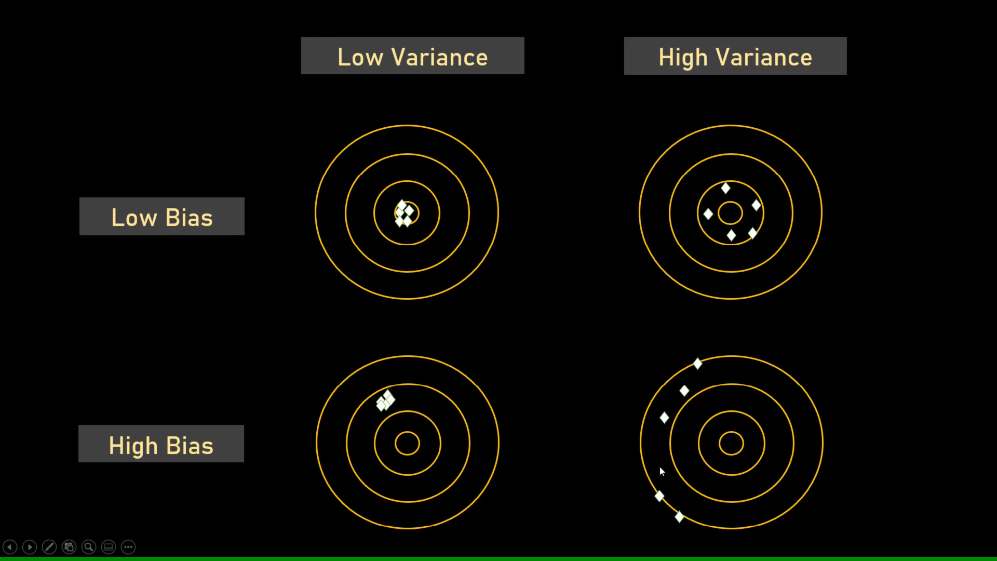)

Truth value = inner circle

predicted values = white diamonds

* When predited values coincided with truth values(low bias) and cluster all together(low variance) - 1.1

* When predicted values closed to the inner circle(low bais) and not cluster together(high variance) - 1.2

* When predicted values cluster together(low variance) and not close to truth values(high bias) - 2.1

* When predicted values are far from each others(high variance) and far from truth values as well(hogh bias) - 2.2


![codebasics - Machine Learning Tutorial Python - 20 Bias vs Variance In Machine Learning [B01qMFMAgUQ - 997x561 - 10m36s].png](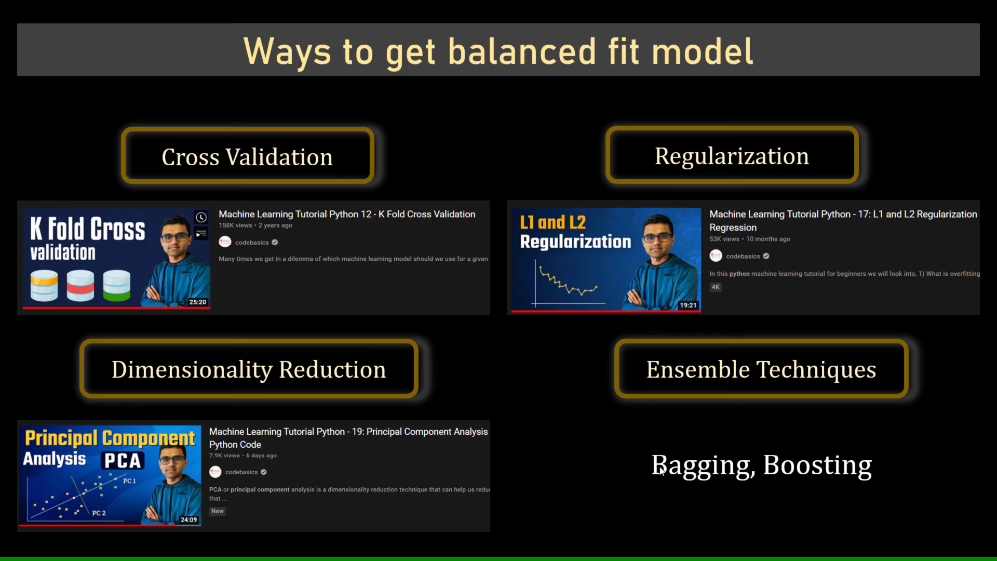)

# L21 : Ensemble Learning - Bagging

To make a decision, we take openions from different people.

To tackle high variance problem : we take the help of ensamble learning.

**In ensamble learning we train multiple models on the same dataset and then while prediction, we make prediction from multiple models and whatever output we get, we combine that result somehow to get our final output.**

Bagging and boosting are two main techniques of Ensemble learning.

![codebasics - Machine Learning Tutorial Python - 21 Ensemble Learning - Bagging [RtrBtAKwcxQ - 997x561 - 2m09s].png](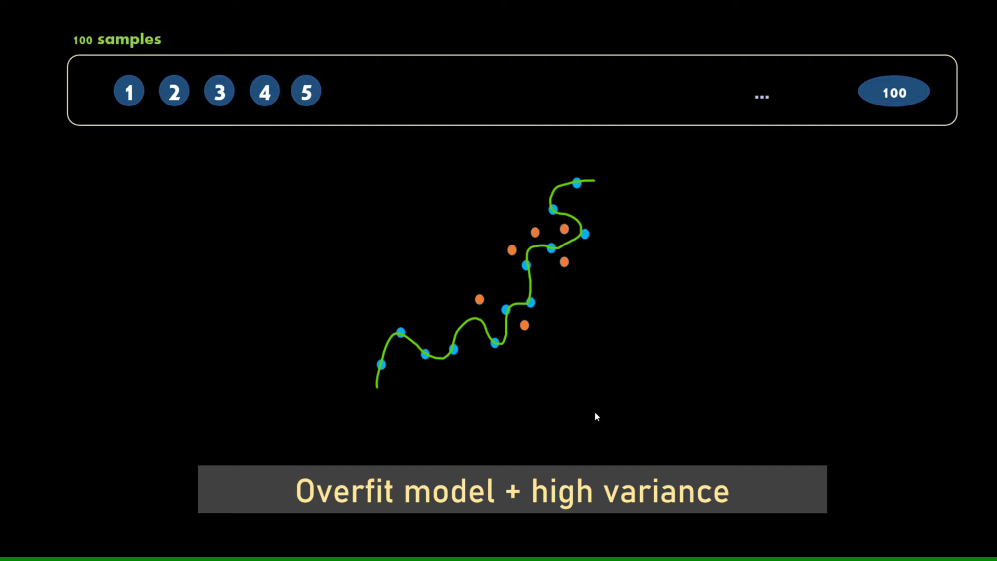)

To tackle this **high variance problem**, we can use ensemble learning.

overfit => high variance

overfit causes high variance

![codebasics - Machine Learning Tutorial Python - 21 Ensemble Learning - Bagging [RtrBtAKwcxQ - 997x561 - 2m27s].png](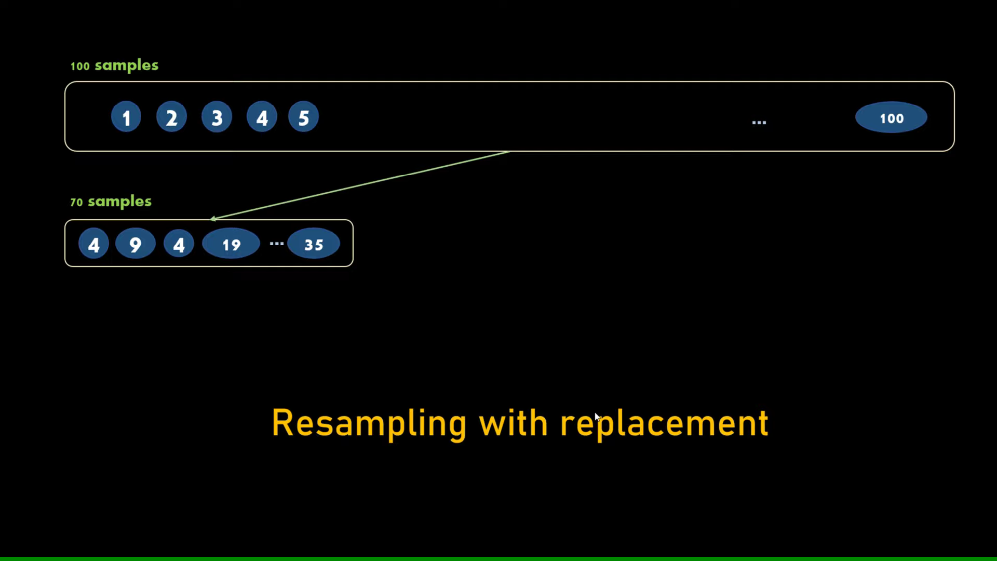)

Resampling with replacement = same datapoint have equal probability of being selected in each dataset.

Individual models are weak learners = they are trained at the subset of original dataset. Hence they don't overfit. THey will generalize beeter.

![codebasics - Machine Learning Tutorial Python - 21 Ensemble Learning - Bagging [RtrBtAKwcxQ - 997x561 - 4m22s].png](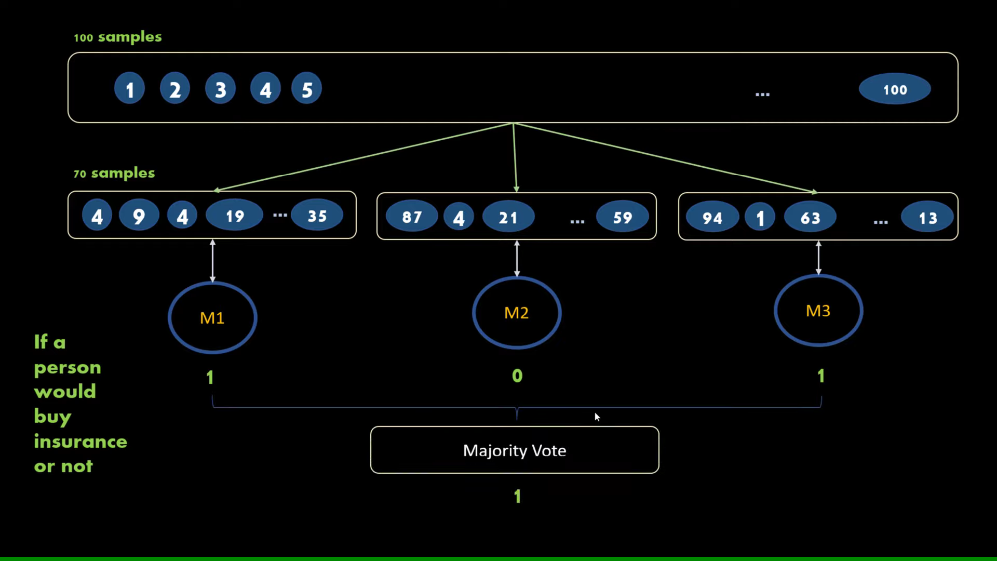)

Same for regression

![codebasics - Machine Learning Tutorial Python - 21 Ensemble Learning - Bagging [RtrBtAKwcxQ - 997x561 - 5m10s].png](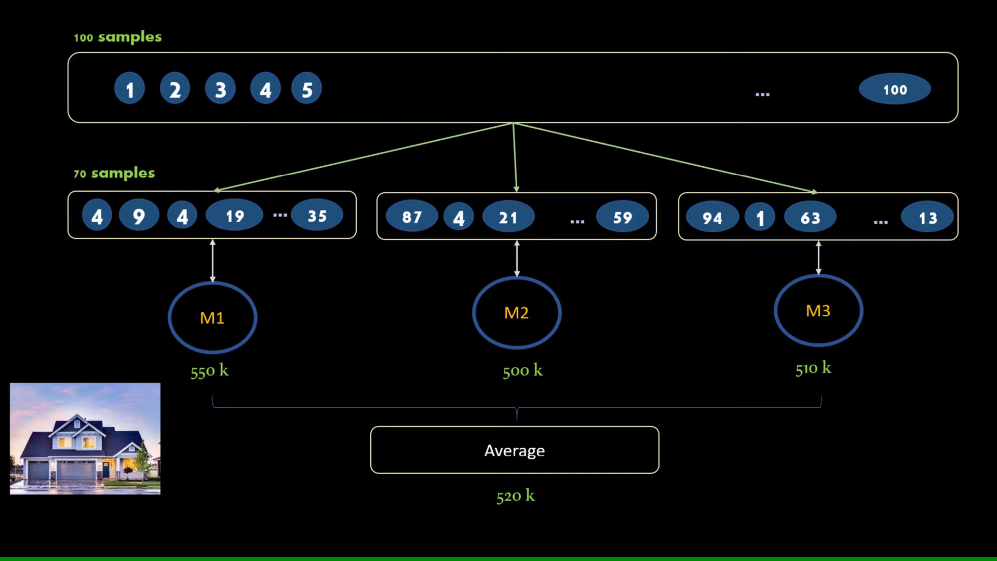)

Here in regression, you take average of whatever values had been predicted by the model.

bagging = bootstrap aggregation



![codebasics - Machine Learning Tutorial Python - 21 Ensemble Learning - Bagging [RtrBtAKwcxQ - 997x561 - 5m39s].png](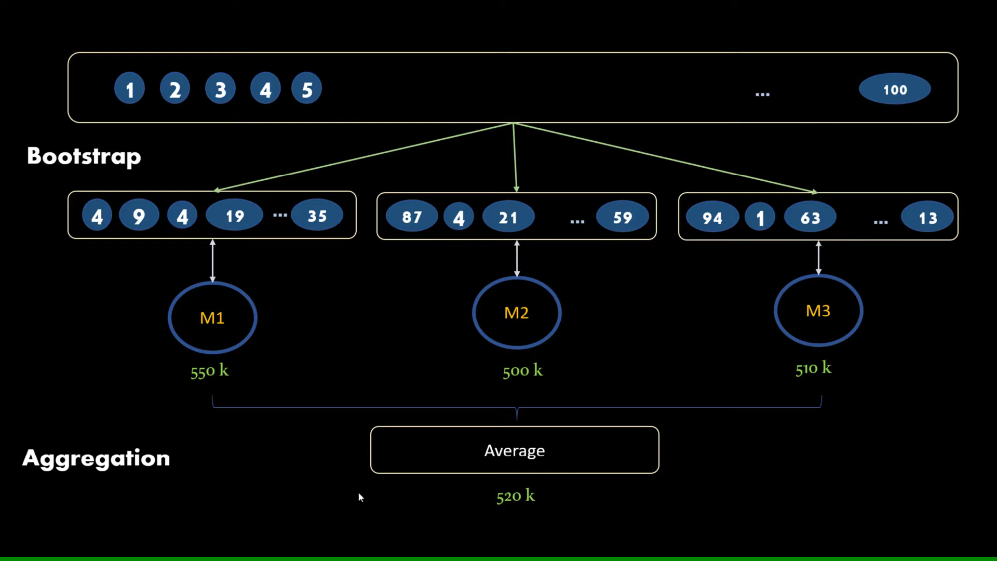)

Random forest is one of the bagging technique with only one distiction where we not only sample the data rows, but also sample the features.

sample rows as well as column in Random forest.

![codebasics - Machine Learning Tutorial Python - 21 Ensemble Learning - Bagging [RtrBtAKwcxQ - 997x561 - 7m12s].png](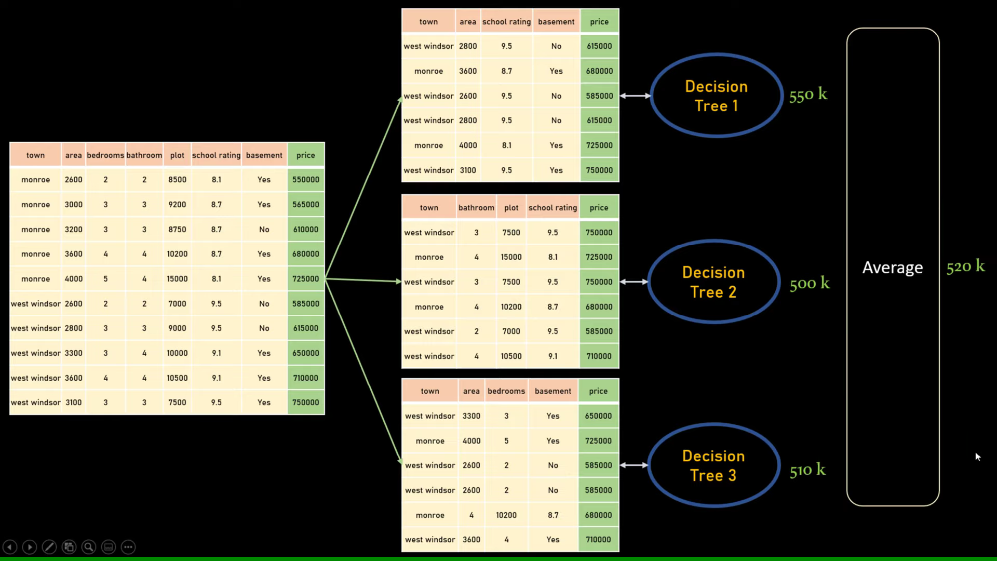)

In Random forest you are randomly picking rows as well as columns, and then on individual datasets you train decision tree model. And then you agree with results

So random forest is definately a bagging technique with the modification that besides randomly selecting rows, we also do random selection of columns.

![codebasics - Machine Learning Tutorial Python - 21 Ensemble Learning - Bagging [RtrBtAKwcxQ - 997x561 - 7m36s].png](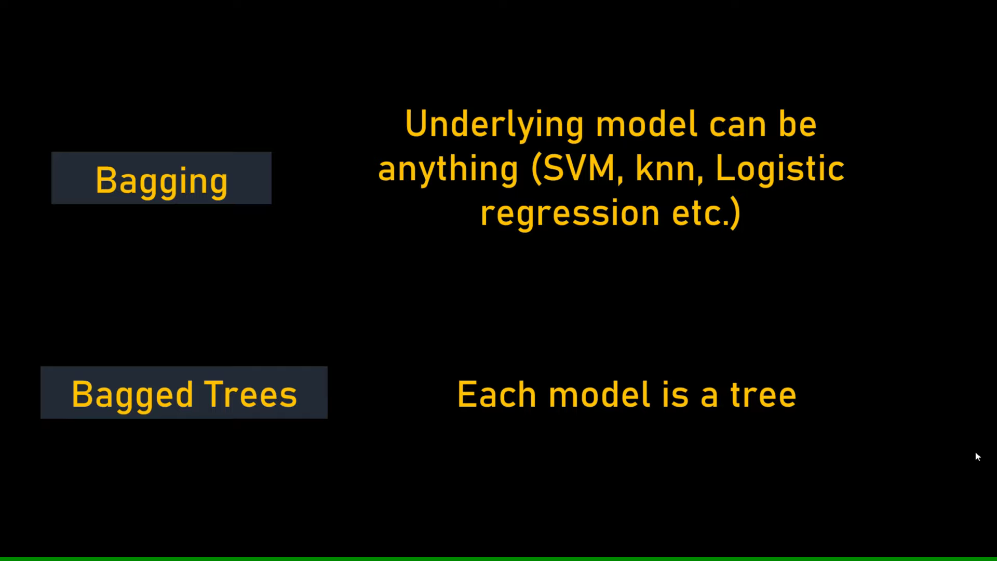)

Random forest is a bagged tree.

Diabetes prediction dataset pr Bagging technique we are going to apply.

In [1]:
import pandas as pd

df = pd.read_csv('diabetes.csv')
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [2]:
df.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [3]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


Assuming no outliers

Next checking imbalance in the dataset

In [4]:
df.Outcome.value_counts()

Outcome
0    500
1    268
Name: count, dtype: int64

it is not a majar imbalance like 10 : 1 or 100:1 ration. It is fine.

In [5]:
268/500

0.536

Slight imbalanace but not something to be worried about.

In [6]:
X = df.drop('Outcome', axis = 'columns')

In [7]:
y = df.Outcome

Now I will do scalling, since the values are in the different ranges.. Although the difference in ranges are not very big, but still to be in safer side, scalling can be done.

In [8]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler() # see previos time hmne 2d array pr scalling ki thi, this time we are doing on 2d dataframe, so both way works.
X_scaled = scaler.fit_transform(X)
X_scaled[:3]

array([[ 0.63994726,  0.84832379,  0.14964075,  0.90726993, -0.69289057,
         0.20401277,  0.46849198,  1.4259954 ],
       [-0.84488505, -1.12339636, -0.16054575,  0.53090156, -0.69289057,
        -0.68442195, -0.36506078, -0.19067191],
       [ 1.23388019,  1.94372388, -0.26394125, -1.28821221, -0.69289057,
        -1.10325546,  0.60439732, -0.10558415]])

In [11]:
X_scaled.dtype

dtype('float64')

In [12]:
type(X_scaled)

numpy.ndarray

So dekho, scalling me pass toh dataframe kiya tha, but output of the scalling is the 2D array.

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, stratify = y, random_state = 4) # since slight imbalance, so use stratify parameter

In [16]:
X_train.shape

(576, 8)

In [17]:
X_test.shape

(192, 8)

In [18]:
y_train.value_counts()

Outcome
0    375
1    201
Name: count, dtype: int64

In [19]:
y_test.value_counts()

Outcome
0    125
1     67
Name: count, dtype: int64

In [20]:
201/375 , 67/125

(0.536, 0.536)

See exact same proportion of diabetic positive(1) and diabetic negative(0) classes in train and test datasets



In [21]:
from sklearn.tree import DecisionTreeClassifier

Decision tree is relatively imbalance classifier. It can overfit. It might generate an high variance model.

Let's train decision tree first.

In [22]:
from sklearn.model_selection import cross_val_score

score = cross_val_score(DecisionTreeClassifier(), X_scaled, y, cv=5) # 5 time training
score

array([0.68181818, 0.65584416, 0.71428571, 0.78431373, 0.71895425])

In [23]:
score.mean()

0.7110432051608522

This is the average accuracy.

# Now let's do bagging classifier.

In [24]:
from sklearn.ensemble import BaggingClassifier

In [26]:
bag_model = BaggingClassifier(
    base_estimator = DecisionTreeClassifier(),
    n_estimators = 100, # sunber of sample points, selected randomly to be used for training
    max_samples = 0.8, # use 80 % of the 100 samples for the training
    oob_score = True , # oob = out of back = those sample points, which do not occur/appear in any of the subset, are used to test the accuracy of the model(internal testing). This is testing within X_train(20 out of 100).Actual testing sample is different and will be used to test the model after the training
    random_state = 0
)

bag_model.fit(X_train,y_train)
bag_model.oob_score_

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


0.7690972222222222

In [27]:
bag_model.score(X_test,y_test)

0.7135416666666666

let's use cross validation as well

In [28]:
bag_model = BaggingClassifier(
    base_estimator = DecisionTreeClassifier(),
    n_estimators = 100, # sunber of sample points, selected randomly to be used for training
    max_samples = 0.8, # use 80 % of the 100 samples for the training
    oob_score = True , # oob = out of back = those sample points, which do not occur/appear in any of the subset, are used to test the accuracy of the model(internal testing). This is testing within X_train(20 out of 100).Actual testing sample is different and will be used to test the model after the training
    random_state = 0
)

scores = cross_val_score(bag_model, X_scaled, y, cv = 5)
scores.mean()

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


0.7591800356506239

See base model gives 71 % accuracy and this bagged model gives you 75% accuracy.

So for unstable classifiers like decision tree, bagging helps...


When possiblity of high variance, bagging works.

Train using Random Forest

In [29]:
from sklearn.ensemble import RandomForestClassifier

scores = cross_val_score(RandomForestClassifier(n_estimators=50), X, y, cv=5)
scores.mean()

0.7591460826754943

Underneath it will use bagging, It will not only sample feature rows, it will use sample feature columns as well.